# (24) Simulation -- self [still draft]

**Motivation**: Finalize self motion part, but not vectorized yet. <br>

In [1]:
# HIDE CODE


import os
import sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from analysis.opticflow import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
# HIDE CODE


def show_thetaphi(t, p):
    fig, axes = create_figure(1, 4, (13, 2.5), tight_layout=True)
    im = axes[0].imshow(t, cmap='nipy_spectral')
    plt.colorbar(im, ax=axes[0])

    im = axes[2].imshow(p, cmap='hsv', vmin=0, vmax=2*np.pi)
    plt.colorbar(im, ax=axes[2])

    for ax in [axes[0], axes[2]]:
        ax.invert_yaxis()
        ax.tick_params(labelsize=10)
        ax.set(
            xticks=ticks,
            yticks=ticks,
            xticklabels=ticklabels,
            yticklabels=ticklabels,
        )

    axes[1].axvline(np.deg2rad(fov), color='r', ls='--', label=f'{fov} deg')
    sns.histplot(
        t.ravel(), ax=axes[1], label=r'$\theta$',
        bins=np.linspace(0, np.pi/2, 91), stat='percent')
    sns.histplot(
        p.ravel(), ax=axes[3], label=r'$\phi$',
        bins=np.linspace(0, 2*np.pi, 91), stat='percent')
    for ax in [axes[1], axes[3]]:
        ax.set_ylabel('')
        ax.legend(loc='upper left')

    plt.show()
    
    
def show_xyzd(x, y, z, d, cmap='Spectral', grid=False):
    fig, axes = create_figure(1, 4, (12, 2.5), 'all', 'all', tight_layout=True)
    im = axes[0].imshow(x, cmap=cmap)
    plt.colorbar(im, ax=axes[0])
    axes[0].set_title(r'$x$', y=1.02, fontsize=17)

    im = axes[1].imshow(y, cmap=cmap)
    plt.colorbar(im, ax=axes[1])
    axes[1].set_title(r'$y$', y=1.02, fontsize=17)

    im = axes[2].imshow(z, cmap=cmap)
    plt.colorbar(im, ax=axes[2])
    axes[2].set_title(r'$z$', y=1.02, fontsize=17)

    im = axes[3].imshow(d, cmap=cmap)
    plt.colorbar(im, ax=axes[3])
    axes[3].set_title(r'$d = \sqrt{x^2+y^2+z^2}$', y=1.02, fontsize=14)

    axes[-1].invert_yaxis()
    for ax in axes.flat:
        ax.tick_params(labelsize=10)
        ax.set(
            xticks=ticks,
            yticks=ticks,
            xticklabels=ticklabels,
            yticklabels=ticklabels,
        )
    if grid:
        add_grid(axes)
    plt.show()
    
    
def hist_xyzd(x, y, d, z=None, bins=30):
    kws = {
        'bins': bins,
        'stat': 'percent',
    }
    fig, axes = create_figure(2, 4, (13, 5), sharey='all', constrained_layout=True)
    sns.histplot(x.ravel(), ax=axes[0, 0], **kws)
    sns.histplot(y.ravel(), ax=axes[0, 1], **kws)
    if z is not None:
        sns.histplot(z.ravel(), ax=axes[0, 2], **kws)
    sns.histplot(d.ravel(), ax=axes[0, 3], **kws)

    sns.histplot(x[of.theta < np.deg2rad(fov)], ax=axes[1, 0], **kws)
    sns.histplot(y[of.theta < np.deg2rad(fov)], ax=axes[1, 1], **kws)
    if z is not None:
        sns.histplot(z[of.theta < np.deg2rad(fov)], ax=axes[1, 2], **kws)
    sns.histplot(d[of.theta < np.deg2rad(fov)], ax=axes[1, 3], **kws)
    
    axes[0, 0].set_title(r'$x$', y=1.02, fontsize=17)
    axes[0, 1].set_title(r'$y$', y=1.02, fontsize=17)
    axes[0, 2].set_title(r'$z$', y=1.02, fontsize=17)
    axes[0, 3].set_title(r'$d$', y=1.02, fontsize=17)
    
    plt.show()
    

def show_velocity(v, cmap='Spectral_r', grid=False):
    rho, phi = vel2polar(v)
    vminmax = np.max(np.abs(v))
    kws = dict(
        cmap='bwr',
        vmax=vminmax,
        vmin=-vminmax,
    )
    fig, axes = create_figure(1, 4, (12, 2.5), 'all', 'all', tight_layout=True)
    im = axes[0].imshow(v[..., 0], **kws)
    plt.colorbar(im, ax=axes[0])
    axes[0].set_title(r'$v_x$', y=1.02, fontsize=17)

    im = axes[1].imshow(v[..., 1], **kws)
    plt.colorbar(im, ax=axes[1])
    axes[1].set_title(r'$v_y$', y=1.02, fontsize=17)

    im = axes[2].imshow(rho, cmap=cmap)
    plt.colorbar(im, ax=axes[2])
    axes[2].set_title(r'$\rho$', y=1.02, fontsize=17)

    im = axes[3].imshow(phi, cmap='hsv', vmin=0, vmax=2*np.pi)
    plt.colorbar(im, ax=axes[3])
    axes[3].set_title(r'$\phi$', y=1.02, fontsize=14)

    axes[-1].invert_yaxis()
    for ax in axes.flat:
        ax.tick_params(labelsize=10)
        ax.set(
            xticks=ticks,
            yticks=ticks,
            xticklabels=ticklabels,
            yticklabels=ticklabels,
        )
    if grid:
        add_grid(axes)
    plt.show()
    

from skimage.transform import resize

def show_opticflow(v):
    fig, axes = create_figure(1, 3, (12, 4), constrained_layout=True)
    axes[0].quiver(
        range(-4, 4 + 1),
        range(-4, 4 + 1),
        resize(v[..., 0], (9,) * 2),
        resize(v[..., 1], (9,) * 2),
        # scale=100,
    )
    axes[1].quiver(
        range(-8, 8 + 1),
        range(-8, 8 + 1),
        resize(v[..., 0], (17,) * 2),
        resize(v[..., 1], (17,) * 2),
        # scale=100,
    )
    axes[2].quiver(
        range(-16, 16 + 1),
        range(-16, 16 + 1),
        resize(v[..., 0], (32+1,) * 2),
        resize(v[..., 1], (32+1,) * 2),
        # scale=150,
    )
    ax_square(axes)
    plt.show()

## Simple

In [3]:
fov = 45
res = 0.1

of = OpticFlow(
    fov=fov,
    res=res,
).compute_coords(fix=(0, 0))

In [4]:
ticks, ticklabels = zip(*[
    (i, str(int(np.round(np.rad2deg(x)))))
    for i, x in enumerate(of.span) if i % 150 == 0
])
ticklabels

('-45', '-30', '-15', '0', '15', '30', '45')

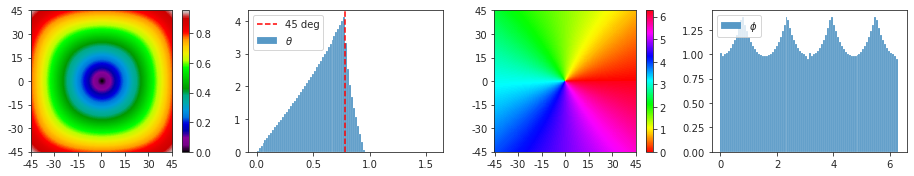

In [5]:
show_thetaphi(of.theta, of.phi)

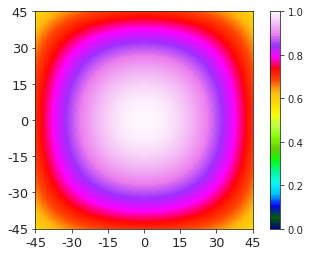

In [6]:
fig, ax = create_figure()
im = ax.imshow(
    np.cos(of.theta),
    cmap='gist_ncar',
    vmin=0,
    vmax=1,
)
plt.colorbar(im, ax=ax)
ax.invert_yaxis()
ax.tick_params(labelsize=13)
ax.set(
    xticks=ticks,
    yticks=ticks,
    xticklabels=ticklabels,
    yticklabels=ticklabels,
)
plt.show()

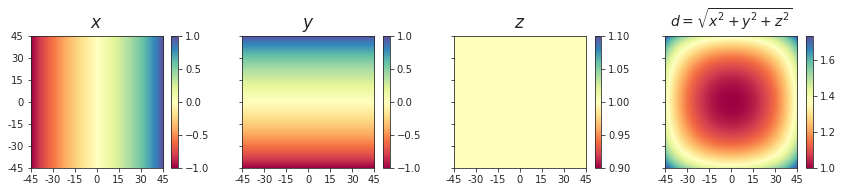

In [7]:
show_xyzd(of.x[0, ..., 0], of.x[0, ..., 1], of.x[0, ..., 2], sp_lin.norm(of.x[0, ...], ord=2, axis=-1))

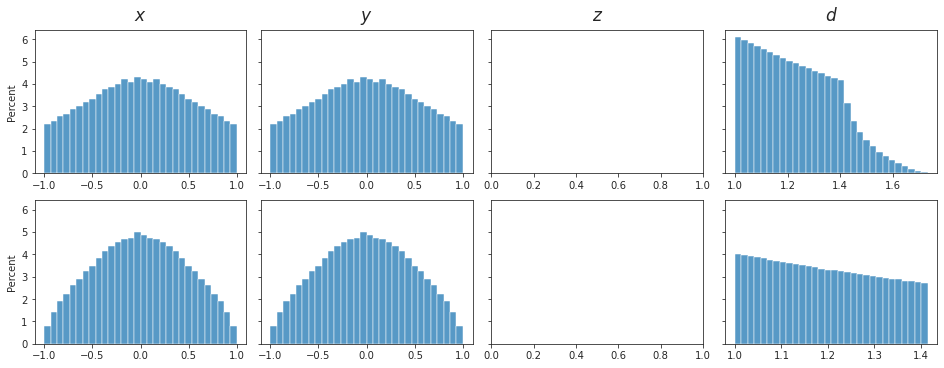

In [8]:
hist_xyzd(of.x[0, ..., 0], of.x[0, ..., 1], sp_lin.norm(of.x[0, ...], ord=2, axis=-1))

### Summary (so far)

- Now I have established a solid relationship between $(\alpha, \beta)$, $(\theta, \phi)$, and $(x, y)$ pairs.
- Maybe -60/+60 is too wide, cosinder narrowing it down.
- Next up: figure out this mapping for arbitrary fixations.
- Finally: differentiate both sides to get anuglar velocities. i.e., $(\dot{\alpha}, \dot{\beta})$.

**Open question:** Resolution requires thinking. Should I choose resolution such that eventually I get $17 \times 17$ (or $33 \times 33$, or $65 \times 65$, etc.), or should I start from fine resolution and apply ```imresize()``` to downsample to arbitrary sizes?

## Arbitrary fixation point

Consider a fixation point
$$\vec{F} = (X_0, Y_0, Z) \equiv (D_0, \Theta_0, \Phi_0),$$
$$D_0 := \sqrt{X_0^2 + Y_0^2 + Z^2}, \cos\Theta_0 = Z/D_0, \tan\Phi_0 = X_0/Y_0.$$

In [9]:
fov = 45
res = 0.1

of = OpticFlow(
    fov=fov,
    res=res,
).compute_coords(fix=(0.3, 0))

In [10]:
ticks, ticklabels = zip(*[
    (i, str(int(np.round(np.rad2deg(x)))))
    for i, x in enumerate(of.span) if i % 150 == 0
])
ticklabels

('-45', '-30', '-15', '0', '15', '30', '45')

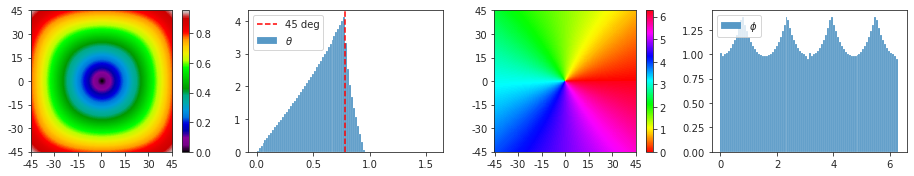

In [11]:
show_thetaphi(of.theta, of.phi)

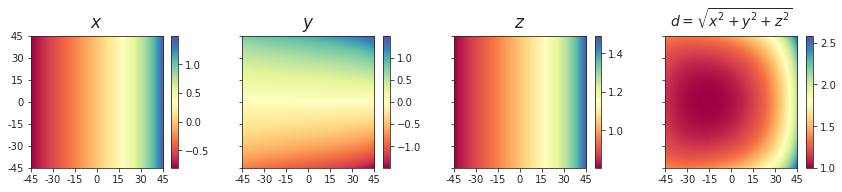

In [12]:
show_xyzd(of.x[0, ..., 0], of.x[0, ..., 1], of.x[0, ..., 2], sp_lin.norm(of.x[0, ...], ord=2, axis=-1))

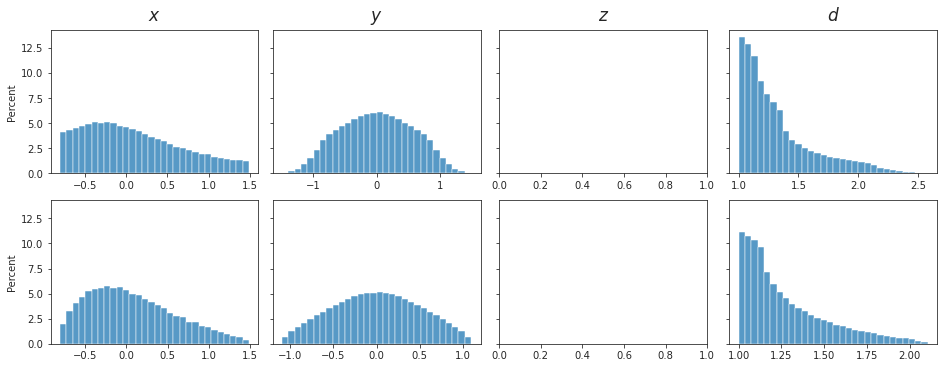

In [13]:
hist_xyzd(of.x[0, ..., 0], of.x[0, ..., 1], sp_lin.norm(of.x[0, ...], ord=2, axis=-1))

## Velocity added

In [14]:
fix = np.array([[0, 0], [0.3, 0], [0, 0.3], [0.3, 0.3]])
fix.shape

(4, 2)

In [15]:
fov = 45
res = 0.1

of = OpticFlow(
    fov=fov,
    res=res,
).compute_coords(fix=fix)

In [16]:
ticks, ticklabels = zip(*[
    (i, str(int(np.round(np.rad2deg(x)))))
    for i, x in enumerate(of.span) if i % 150 == 0
])
ticklabels

('-45', '-30', '-15', '0', '15', '30', '45')

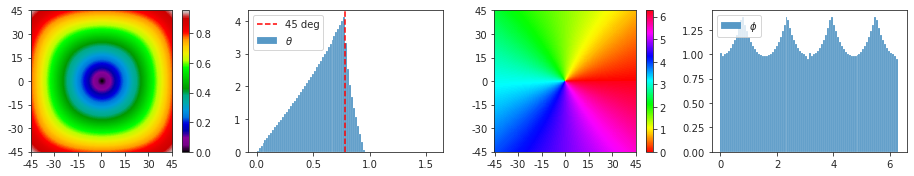

In [17]:
show_thetaphi(of.theta, of.phi)

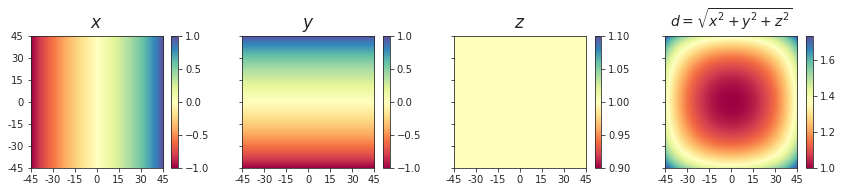

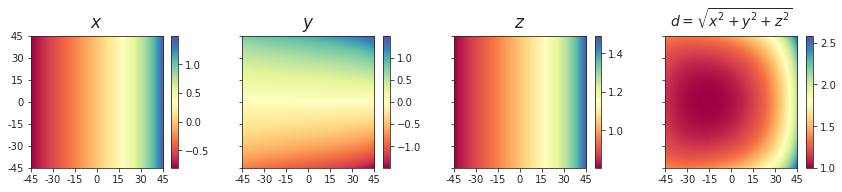

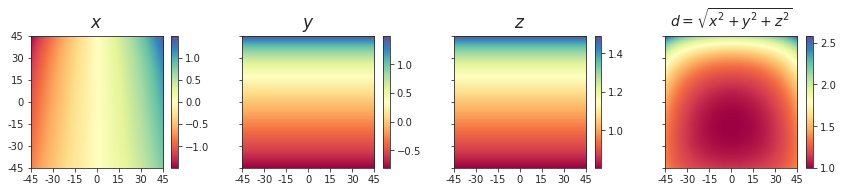

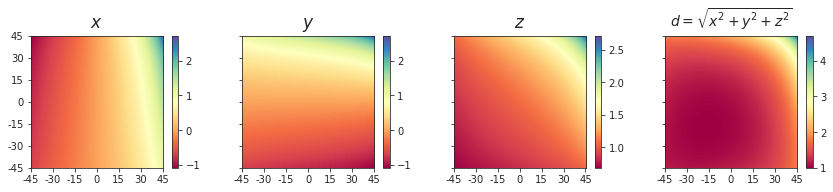

In [18]:
for i in range(len(of.fix)):
    show_xyzd(
        x=of.x[i, ..., 0],
        y=of.x[i, ..., 1],
        z=of.x[i, ..., 2],
        d=sp_lin.norm(of.x[i, ...], ord=2, axis=-1),
    )

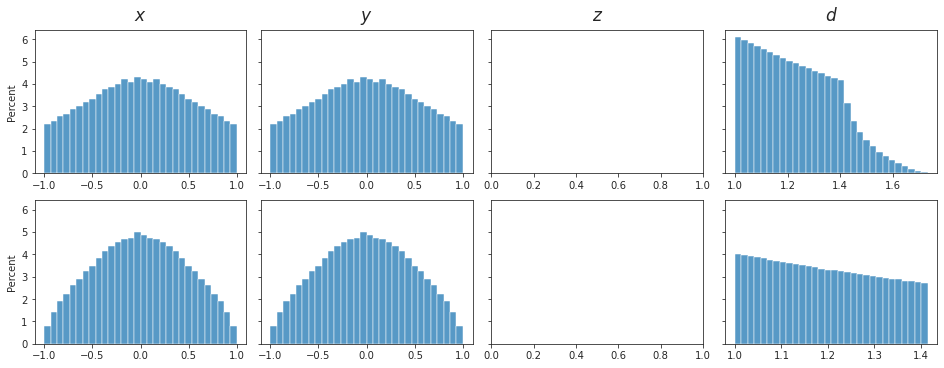

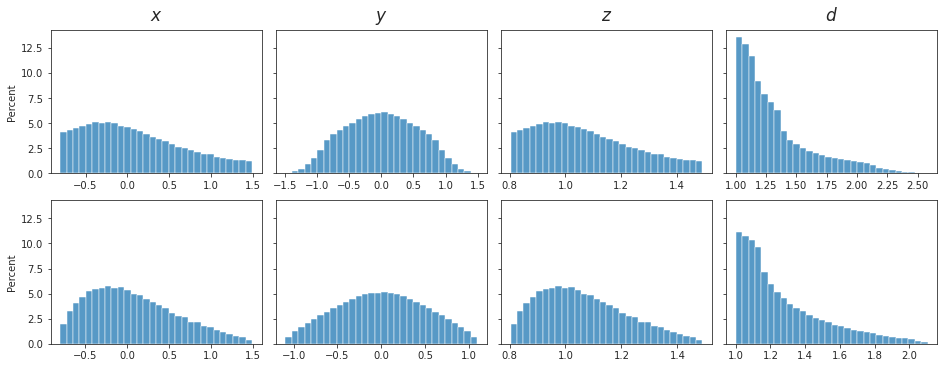

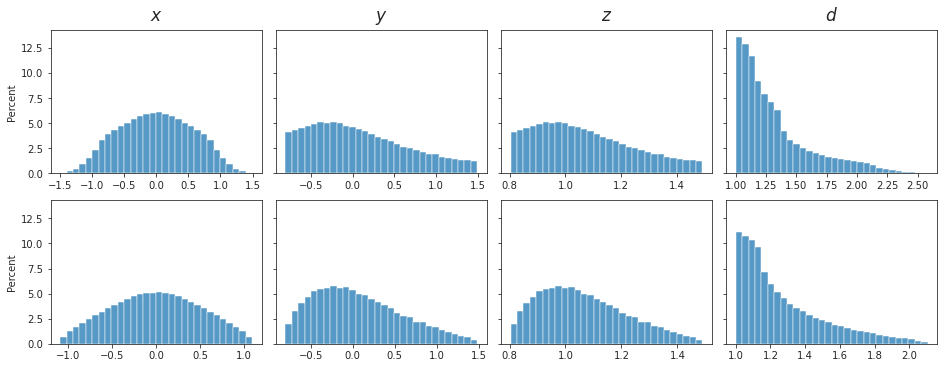

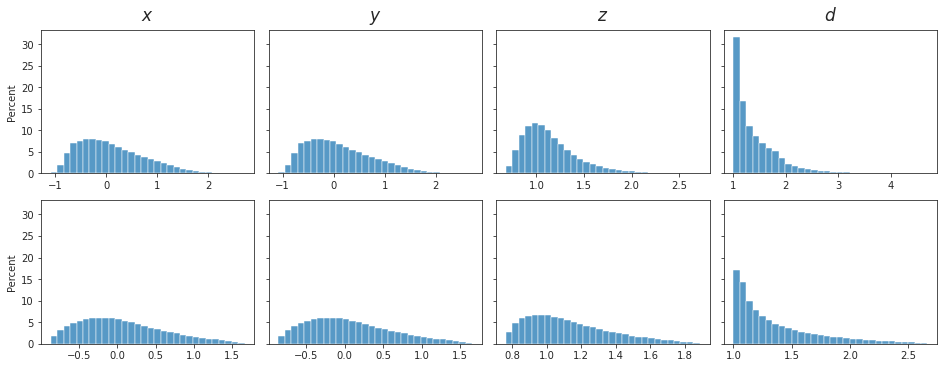

In [19]:
for i in range(len(of.fix)):
    hist_xyzd(
        x=of.x[i, ..., 0],
        y=of.x[i, ..., 1],
        z=None if i == 0 else of.x[i, ..., 2],
        d=sp_lin.norm(of.x[i, ...], ord=2, axis=-1),
    )

In [20]:
vel = np.array([
    [0, 0, 10],
    [0, 0, -10],
    [5, 5, 0],
    [1, -2, 0],
    [3, 0, 10],
    [3, 3, 1],
    [-2, 1, 5],
], dtype=float).T
vel

array([[  0.,   0.,   5.,   1.,   3.,   3.,  -2.],
       [  0.,   0.,   5.,  -2.,   0.,   3.,   1.],
       [ 10., -10.,   0.,   0.,  10.,   1.,   5.]])

In [21]:
v_final, v_normal = of.compute_flow(vel)
v_final.shape

(4, 901, 901, 3, 7)

fixation: [0. 0.],      velocity: [ 0.  0. 10.]

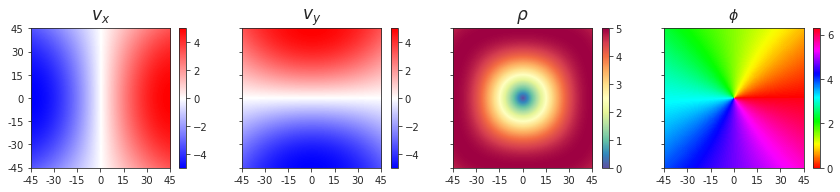

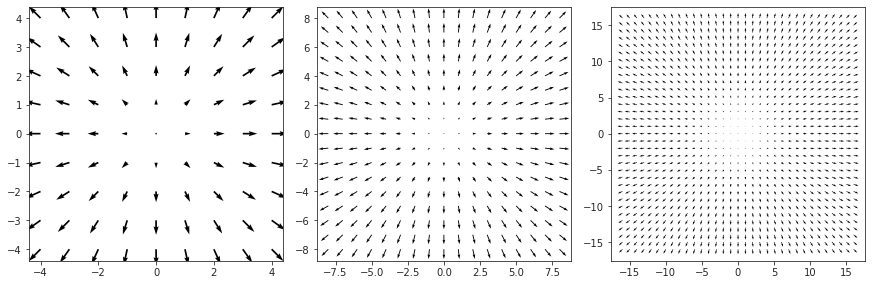

--------------------------------------------------------------------------------

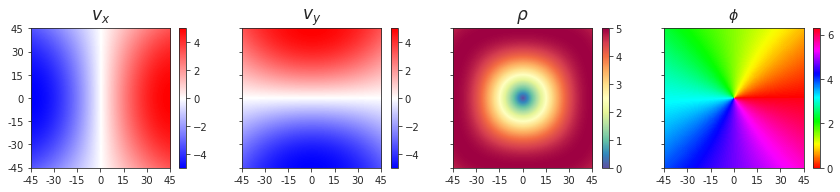

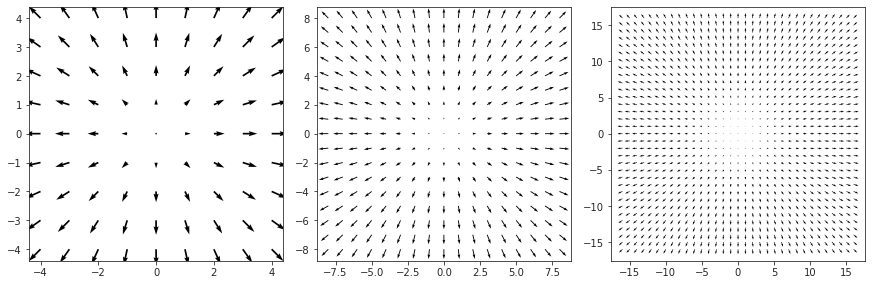

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0. 0.],      velocity: [  0.   0. -10.]

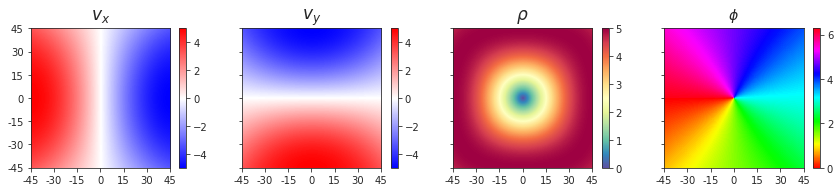

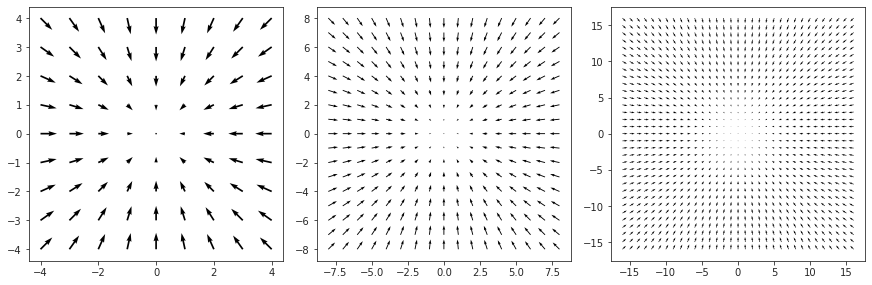

--------------------------------------------------------------------------------

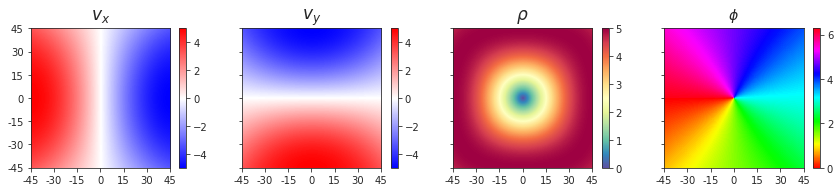

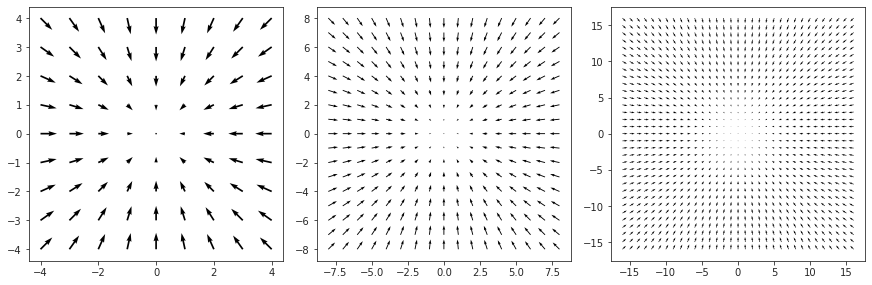

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0. 0.],      velocity: [5. 5. 0.]

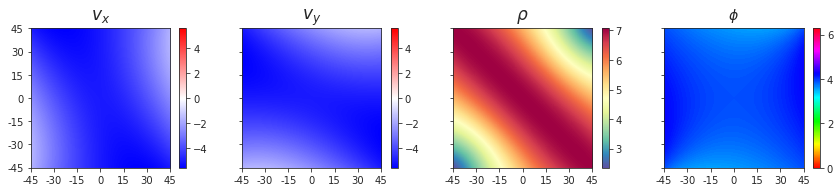

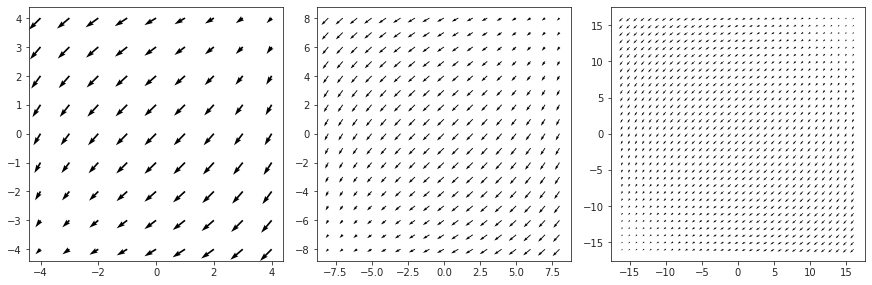

--------------------------------------------------------------------------------

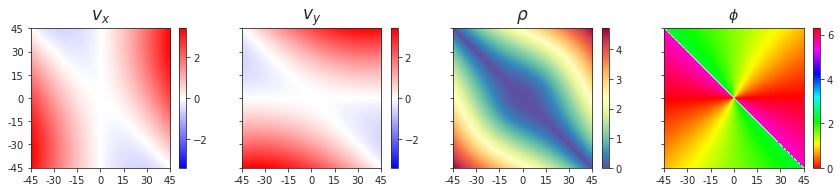

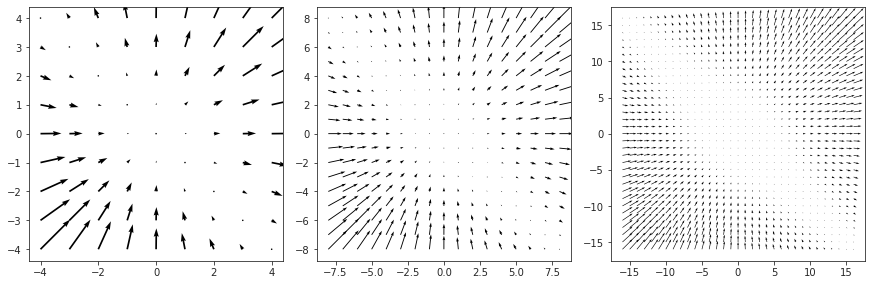

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0. 0.],      velocity: [ 1. -2.  0.]

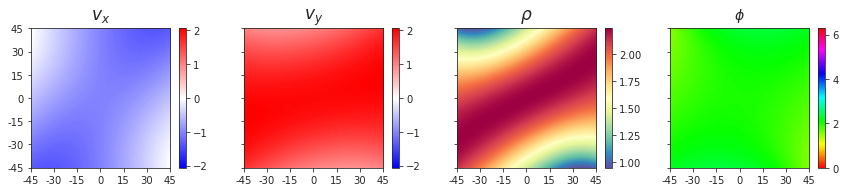

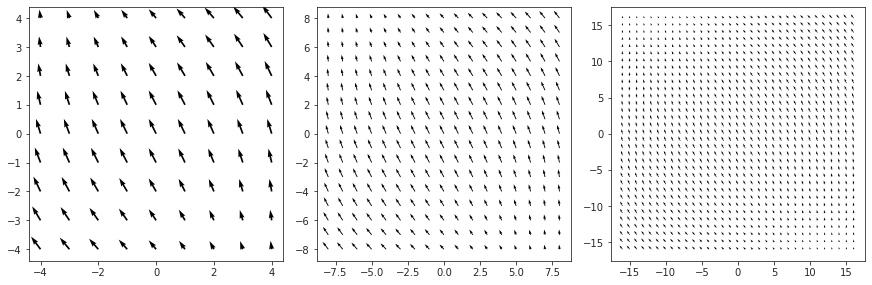

--------------------------------------------------------------------------------

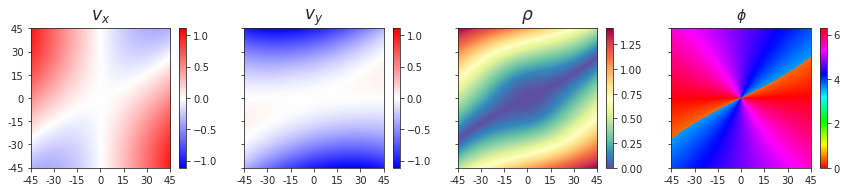

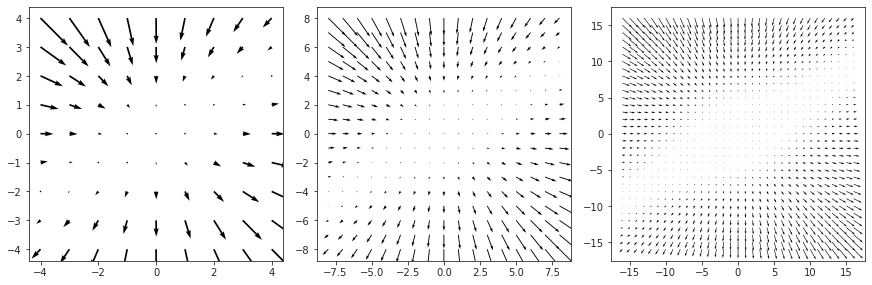

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0. 0.],      velocity: [ 3.  0. 10.]

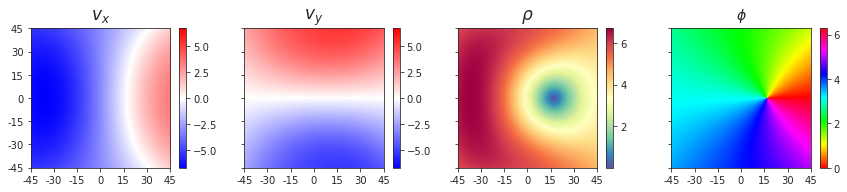

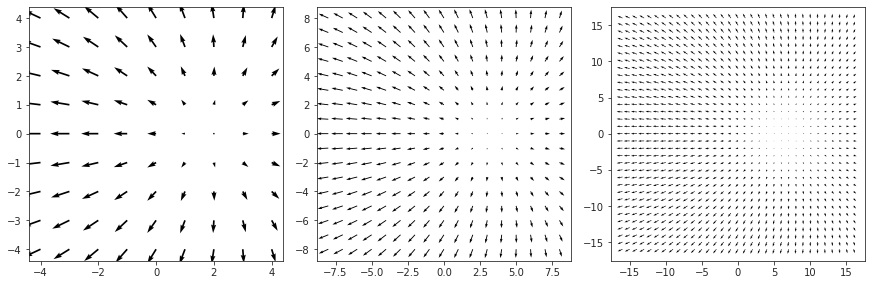

--------------------------------------------------------------------------------

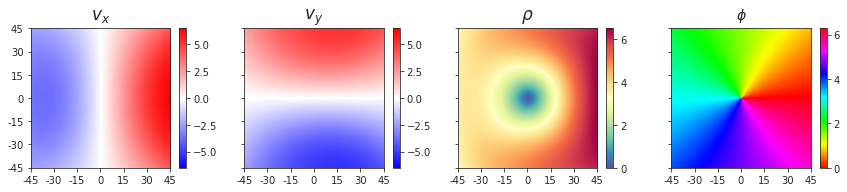

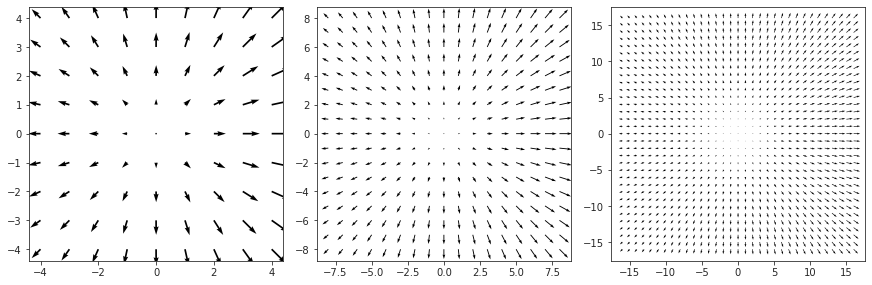

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0. 0.],      velocity: [3. 3. 1.]

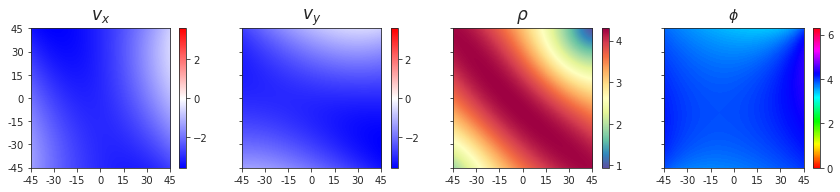

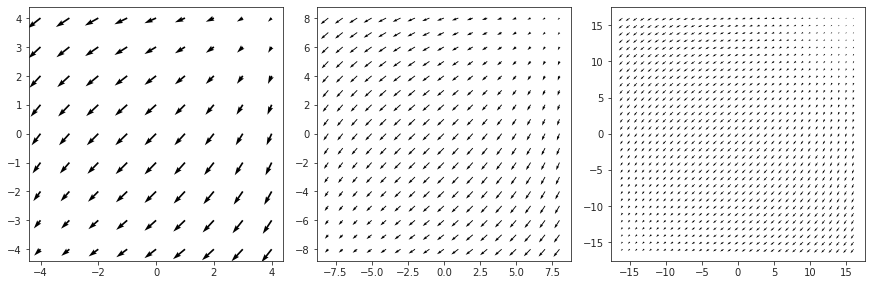

--------------------------------------------------------------------------------

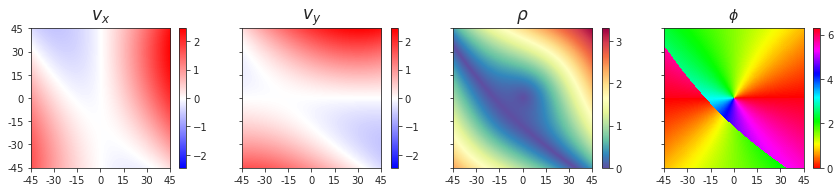

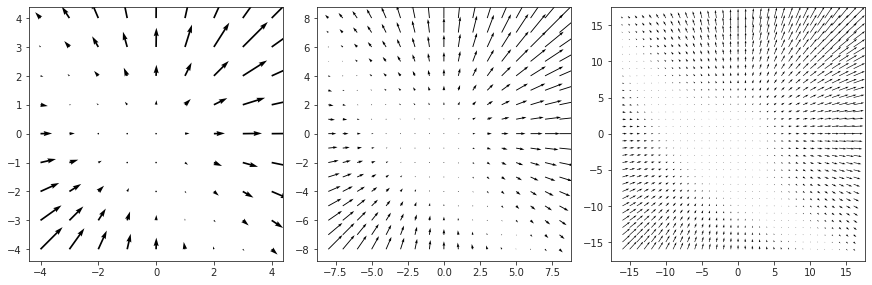

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0. 0.],      velocity: [-2.  1.  5.]

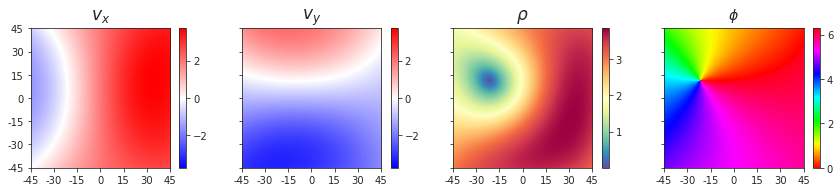

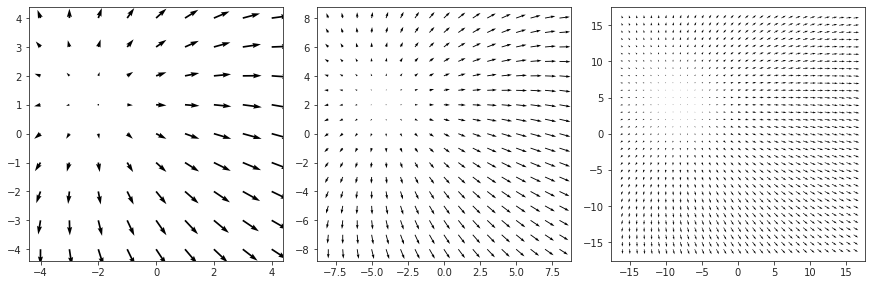

--------------------------------------------------------------------------------

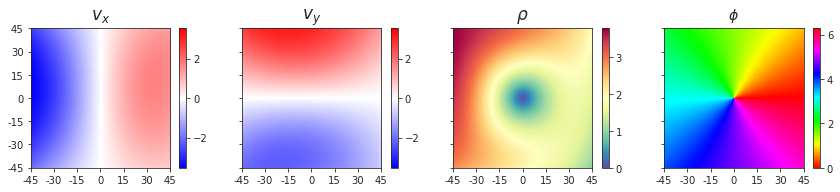

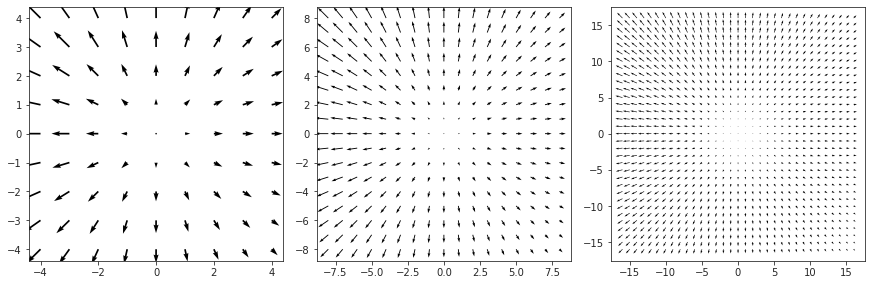

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [ 0.  0. 10.]

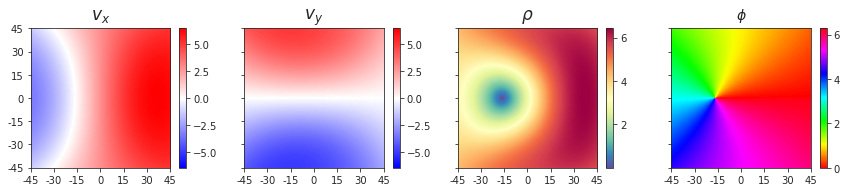

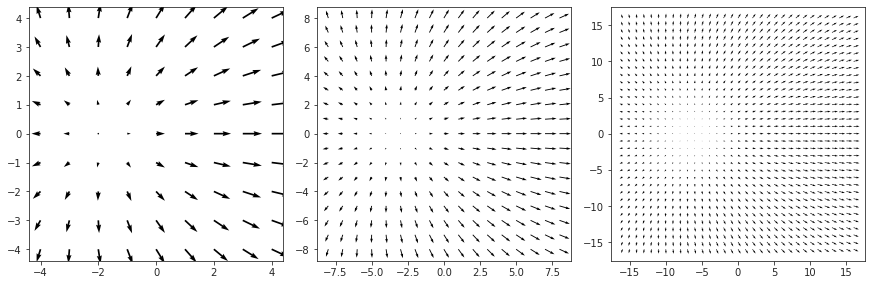

--------------------------------------------------------------------------------

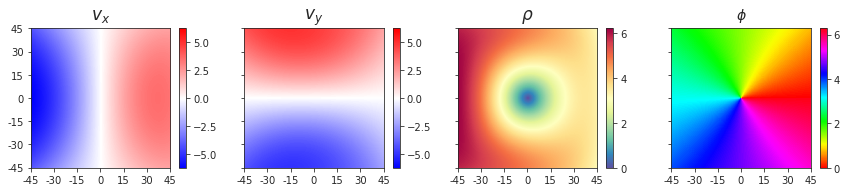

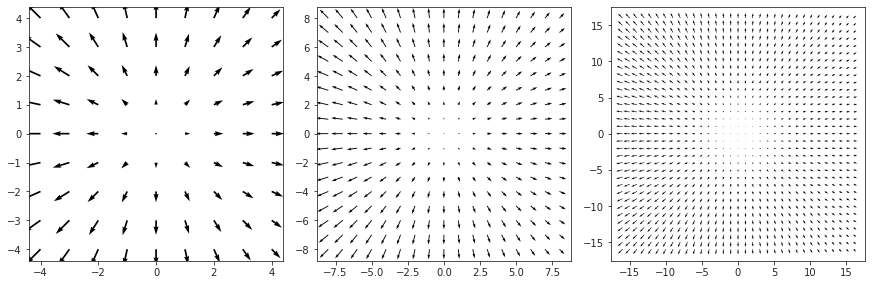

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [  0.   0. -10.]

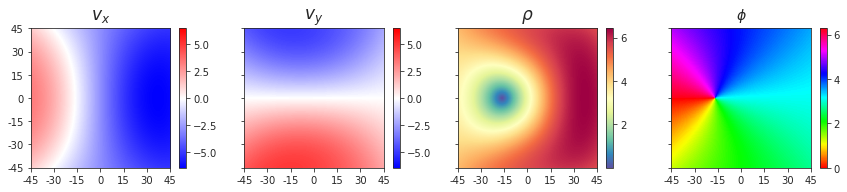

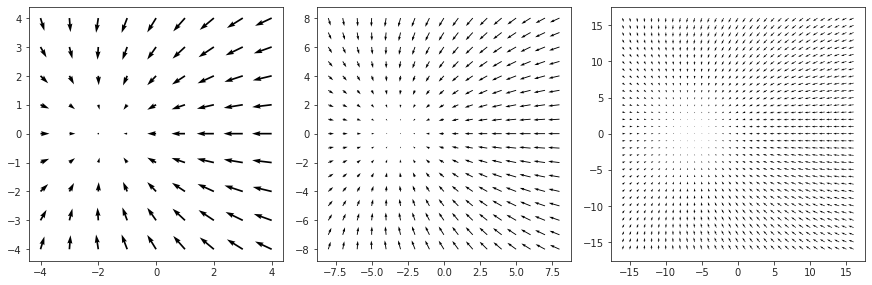

--------------------------------------------------------------------------------

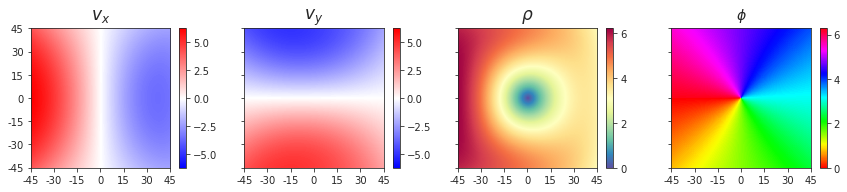

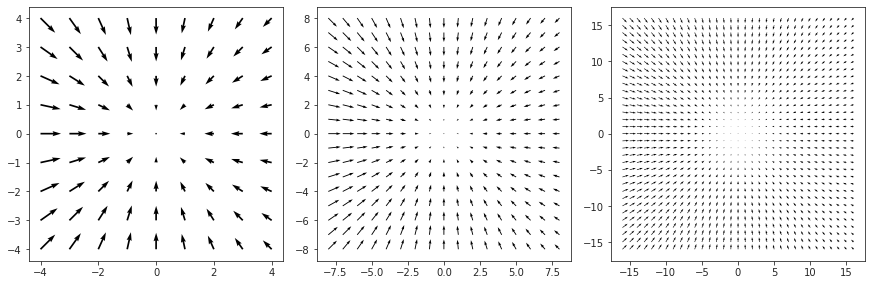

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [5. 5. 0.]

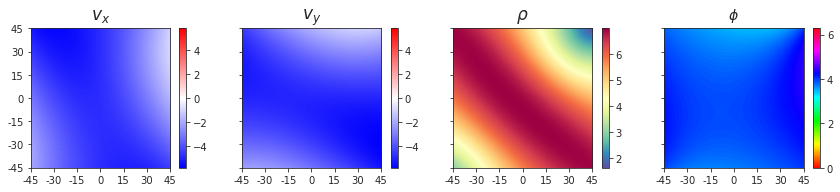

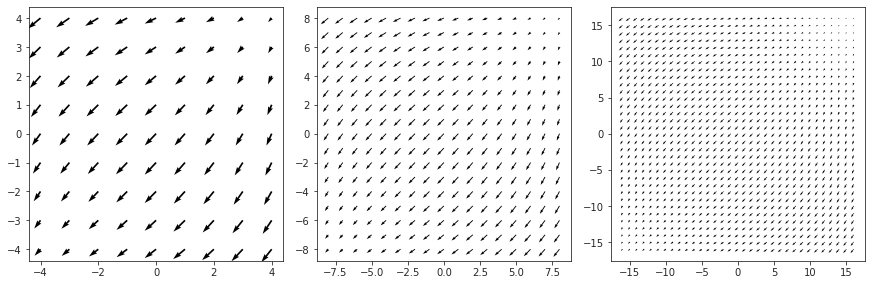

--------------------------------------------------------------------------------

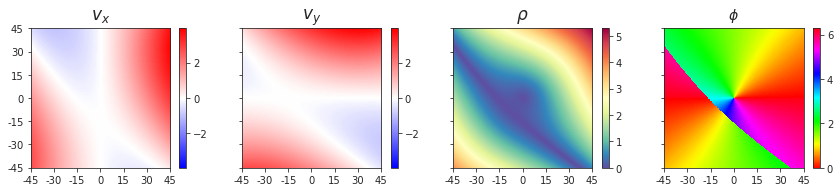

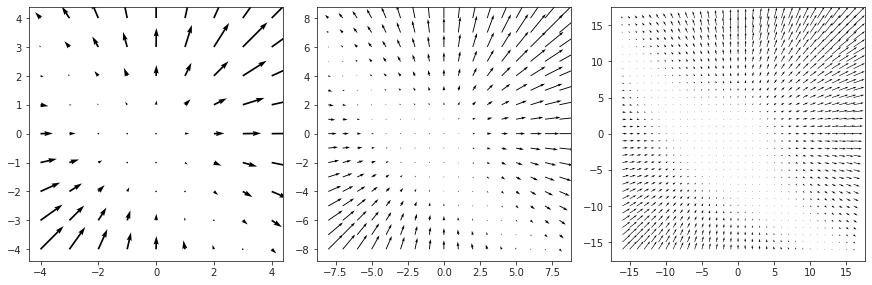

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [ 1. -2.  0.]

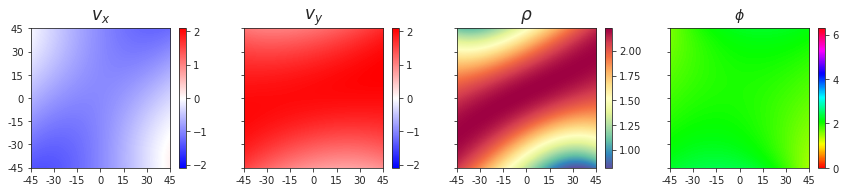

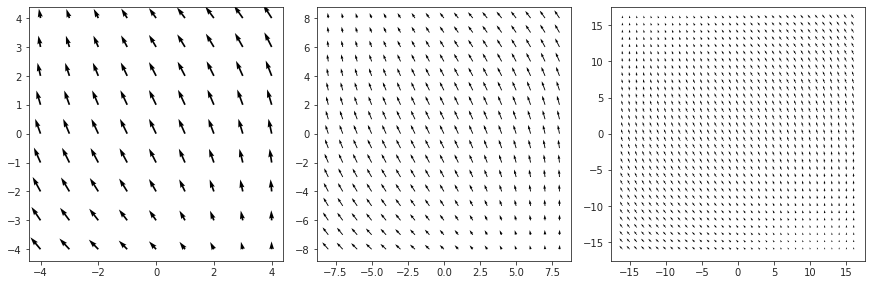

--------------------------------------------------------------------------------

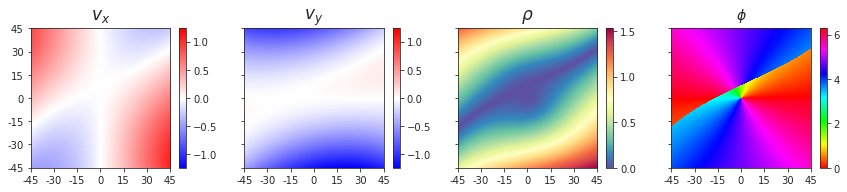

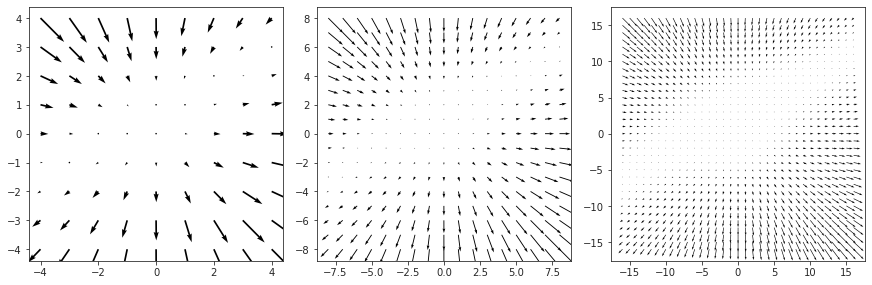

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [ 3.  0. 10.]

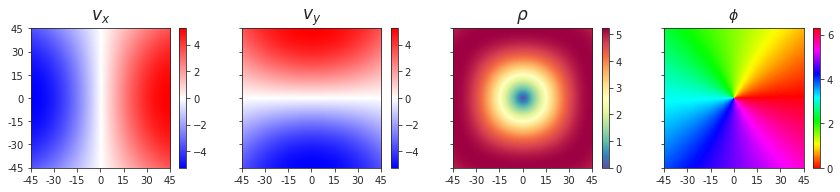

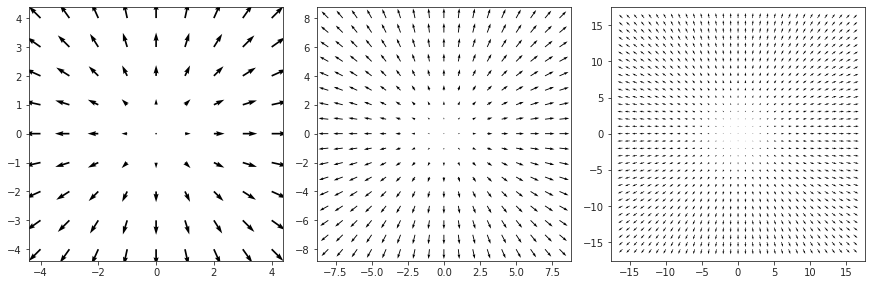

--------------------------------------------------------------------------------

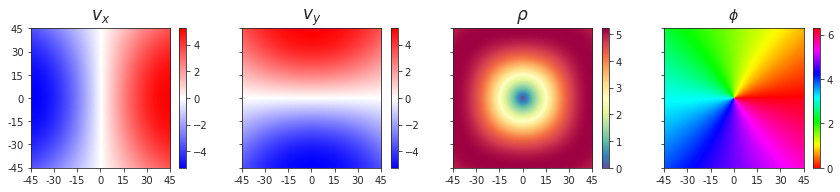

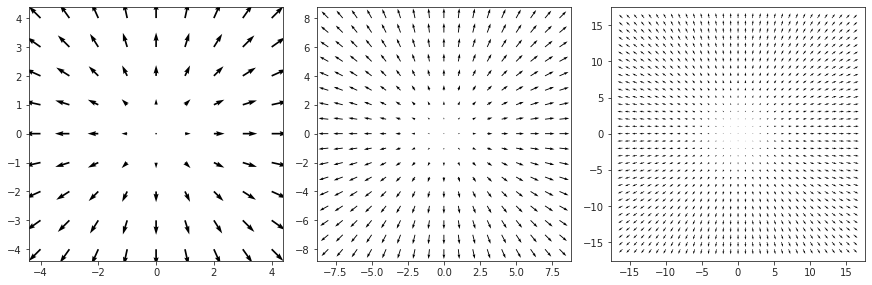

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [3. 3. 1.]

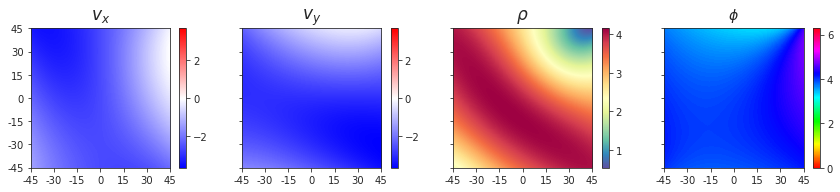

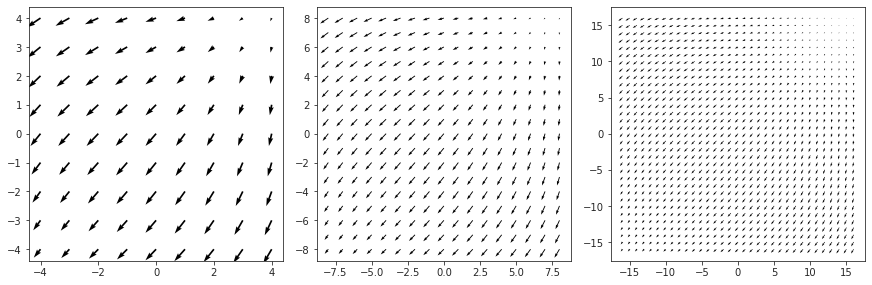

--------------------------------------------------------------------------------

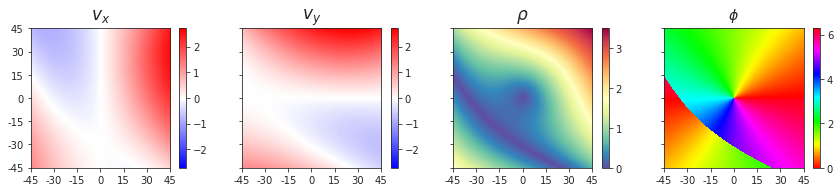

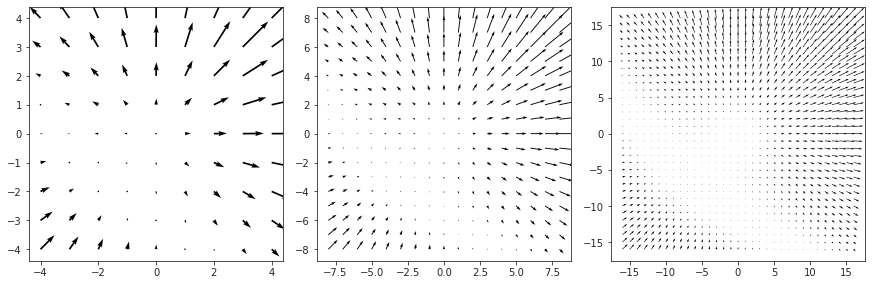

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0. ],    velocity: [-2.  1.  5.]

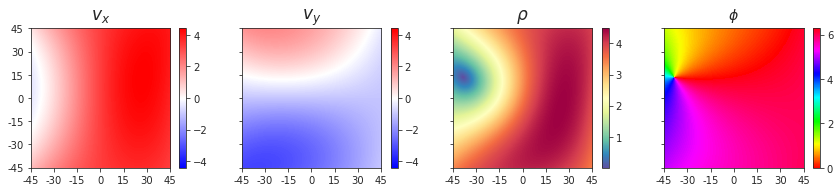

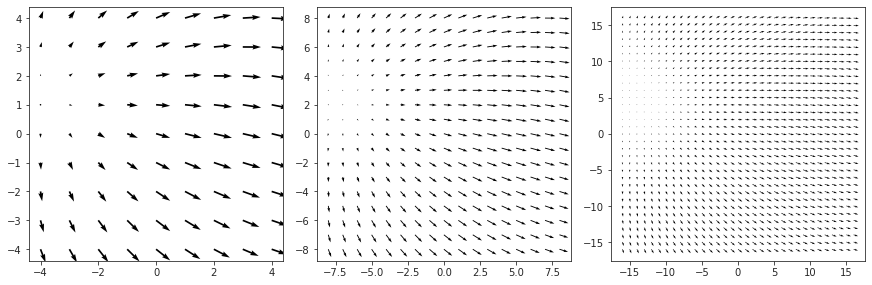

--------------------------------------------------------------------------------

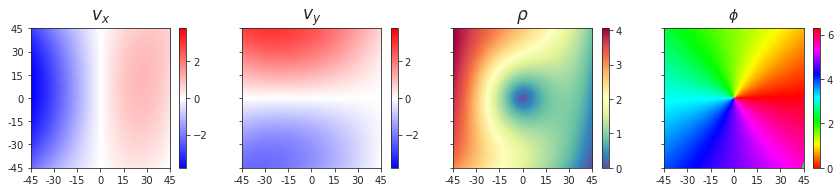

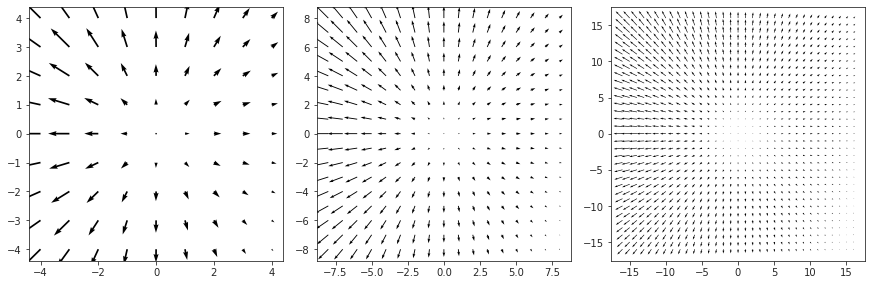

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [ 0.  0. 10.]

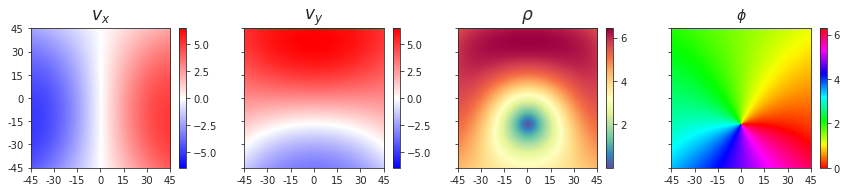

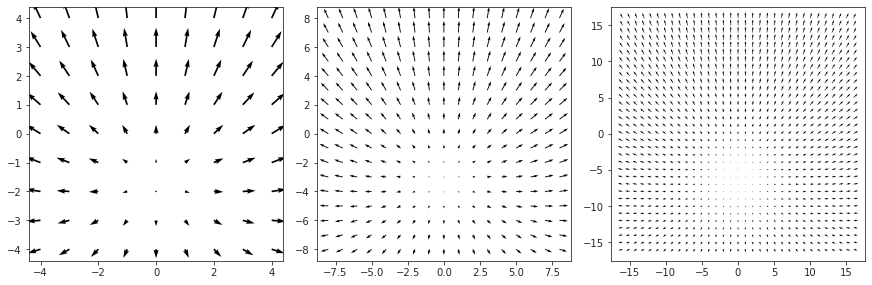

--------------------------------------------------------------------------------

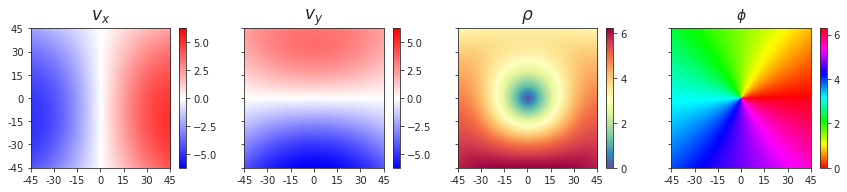

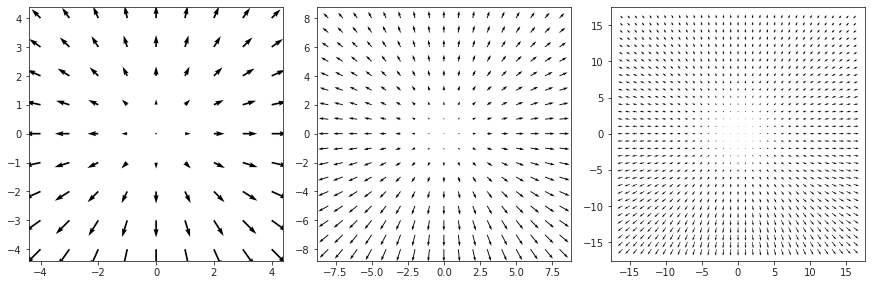

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [  0.   0. -10.]

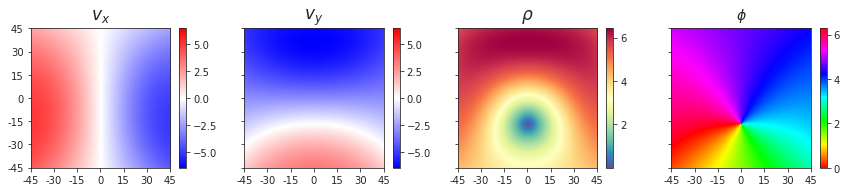

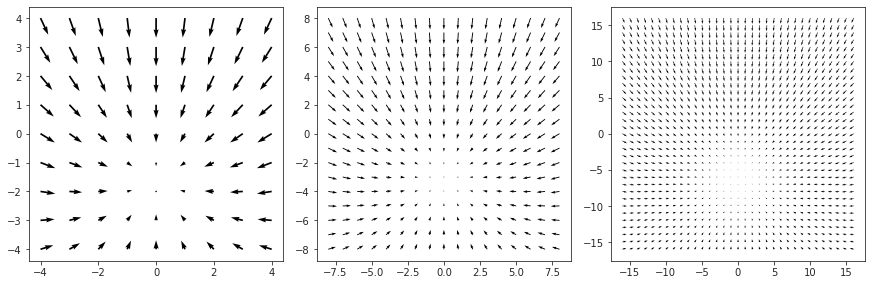

--------------------------------------------------------------------------------

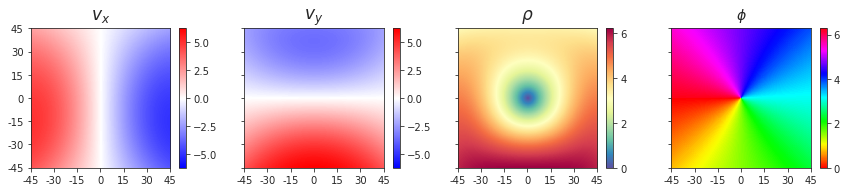

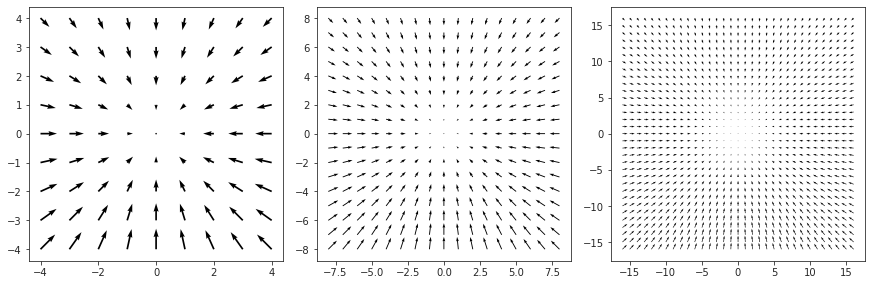

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [5. 5. 0.]

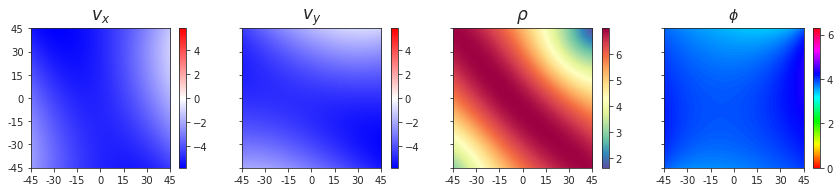

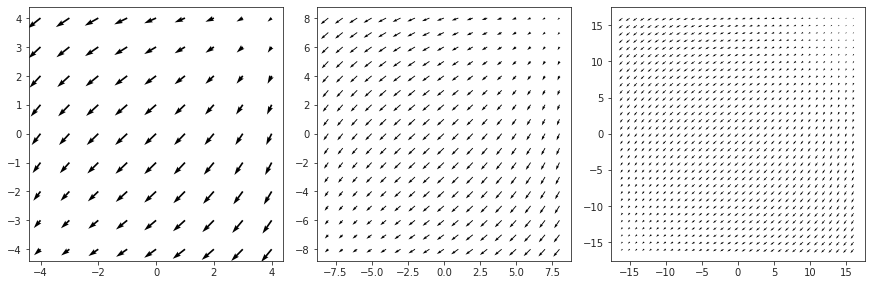

--------------------------------------------------------------------------------

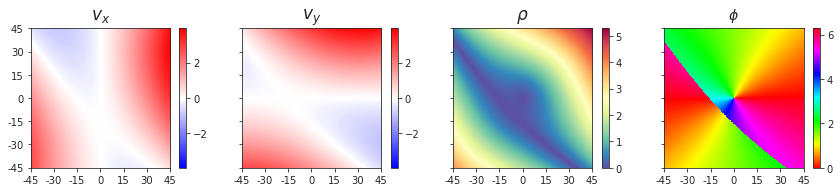

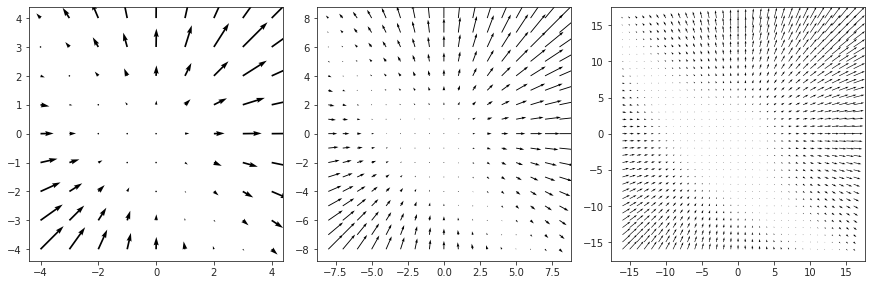

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [ 1. -2.  0.]

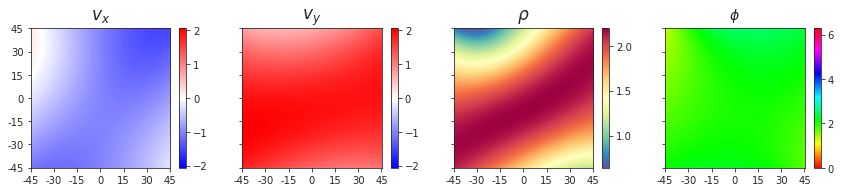

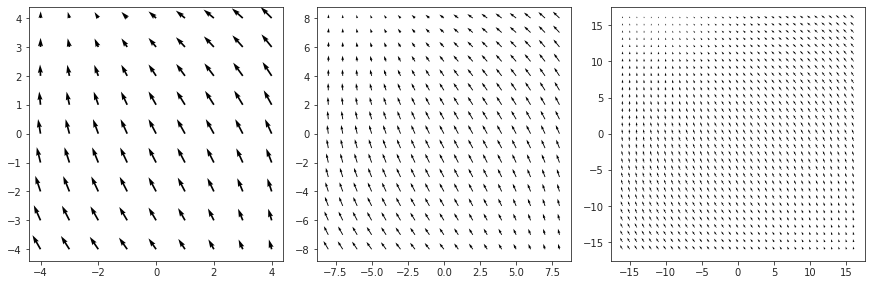

--------------------------------------------------------------------------------

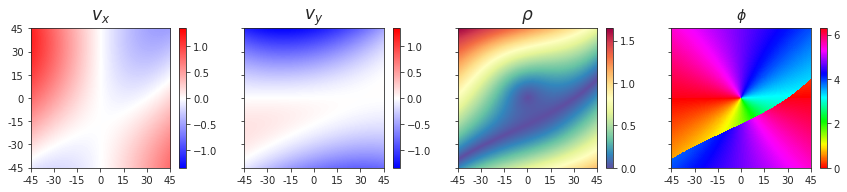

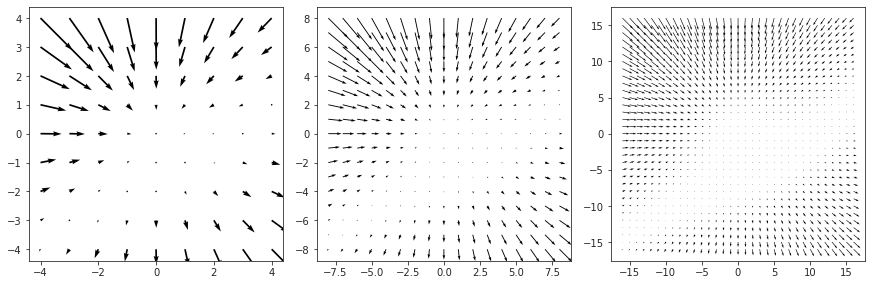

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [ 3.  0. 10.]

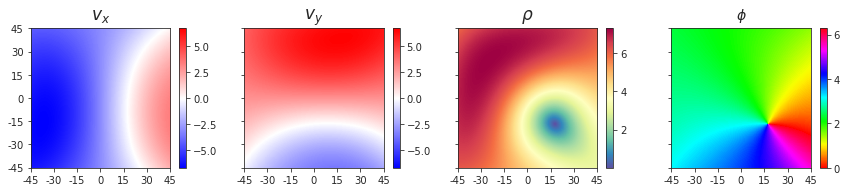

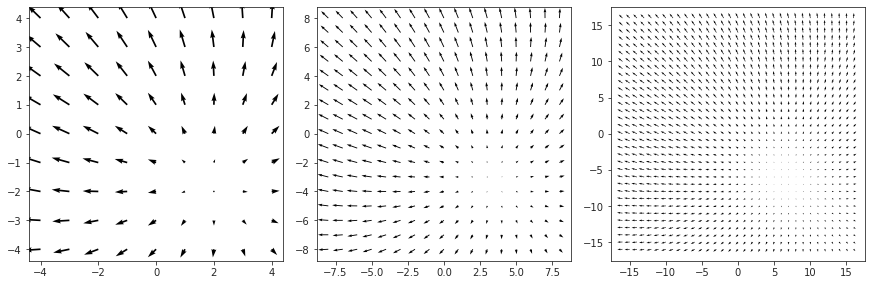

--------------------------------------------------------------------------------

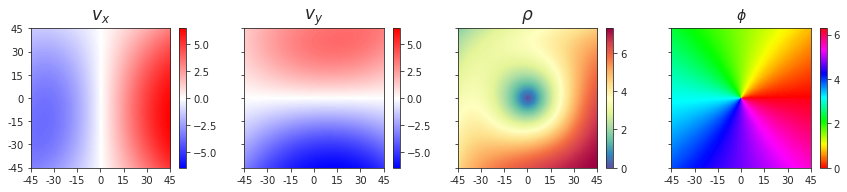

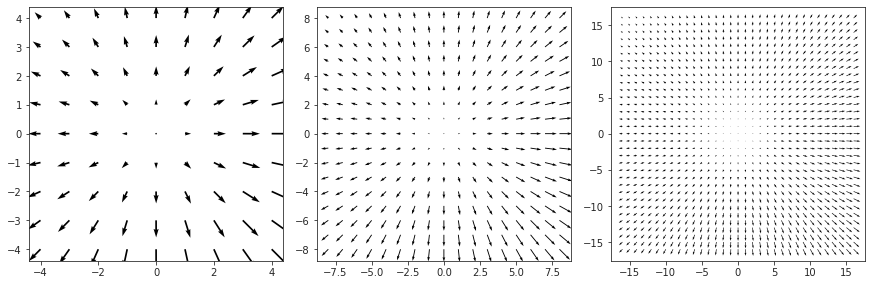

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [3. 3. 1.]

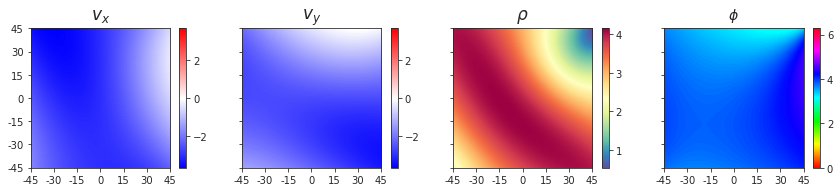

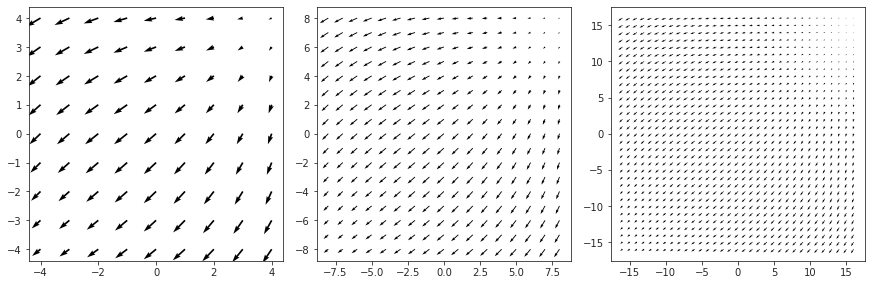

--------------------------------------------------------------------------------

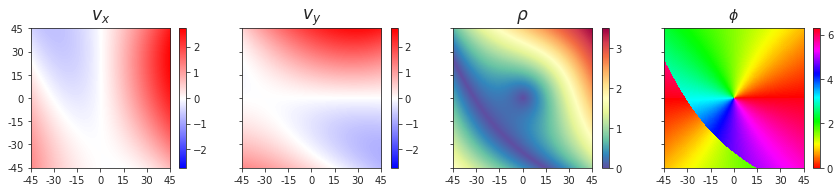

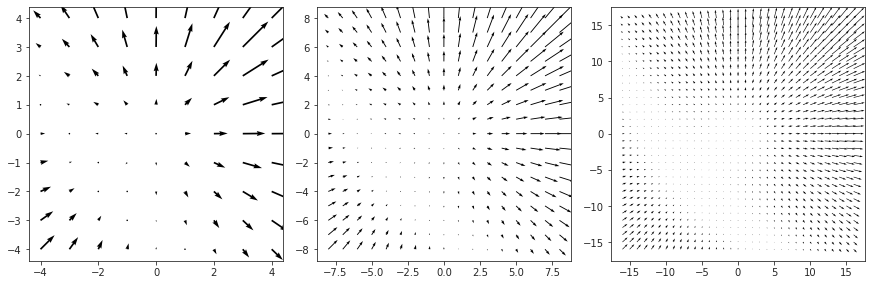

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.  0.3],    velocity: [-2.  1.  5.]

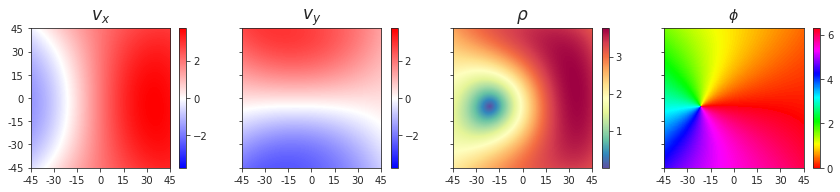

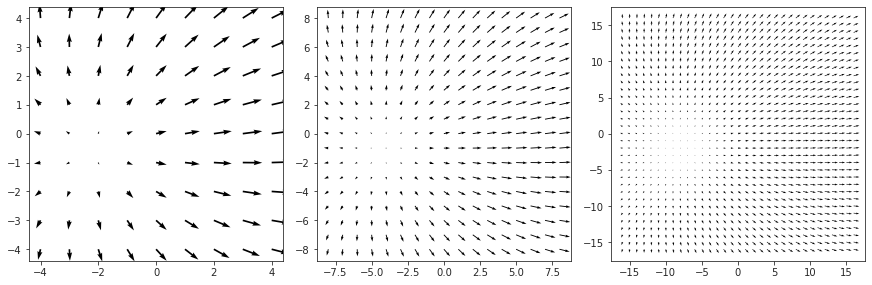

--------------------------------------------------------------------------------

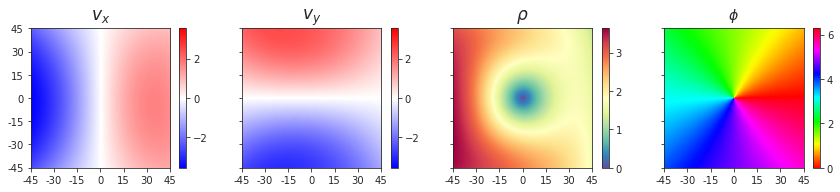

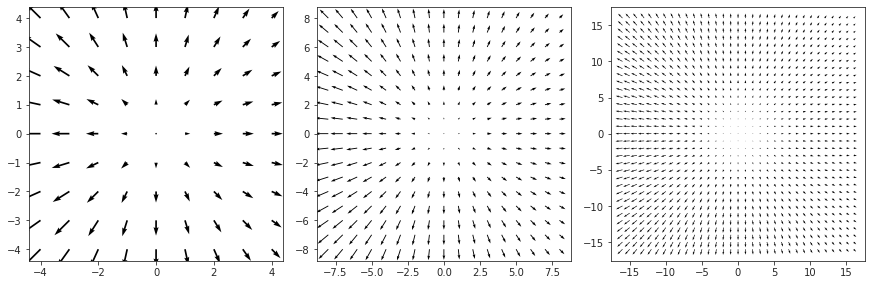

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [ 0.  0. 10.]

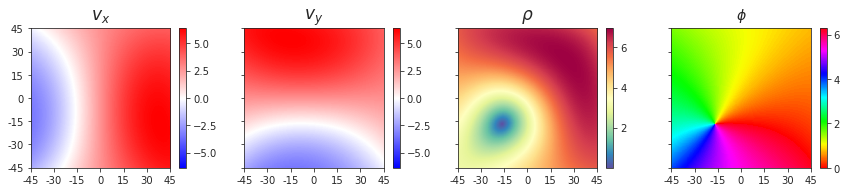

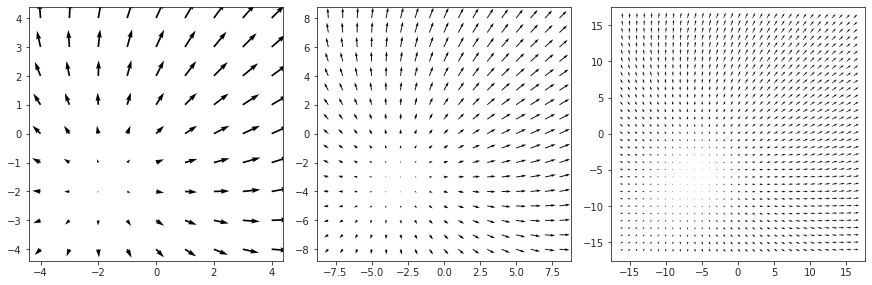

--------------------------------------------------------------------------------

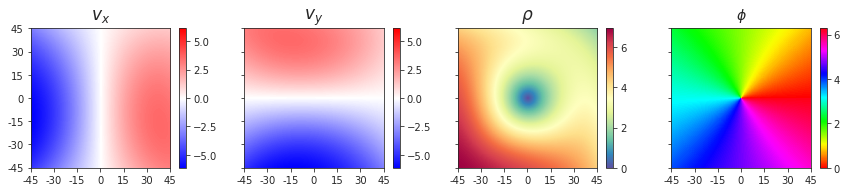

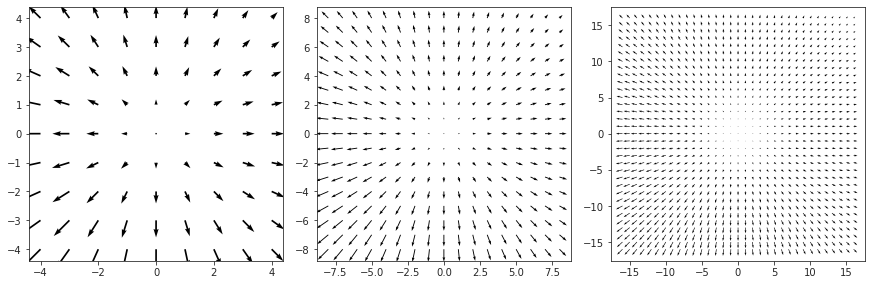

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [  0.   0. -10.]

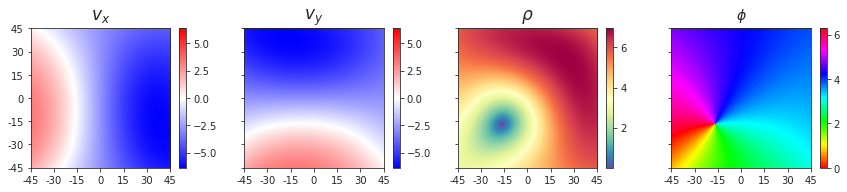

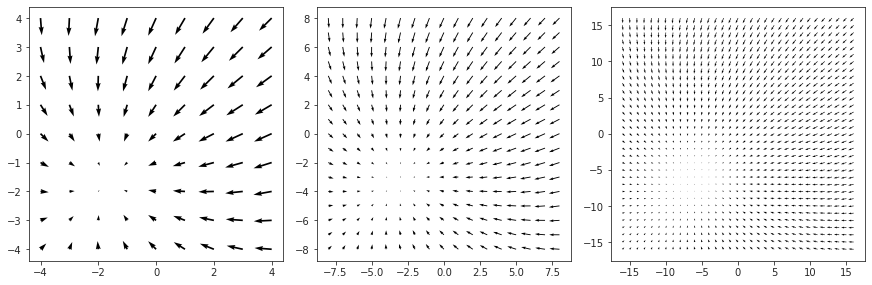

--------------------------------------------------------------------------------

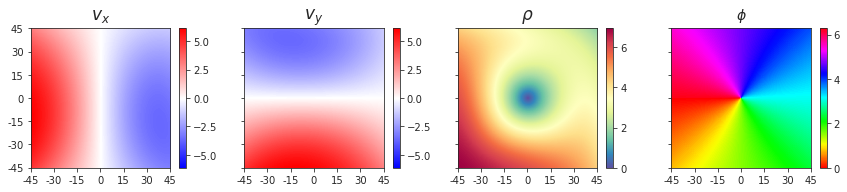

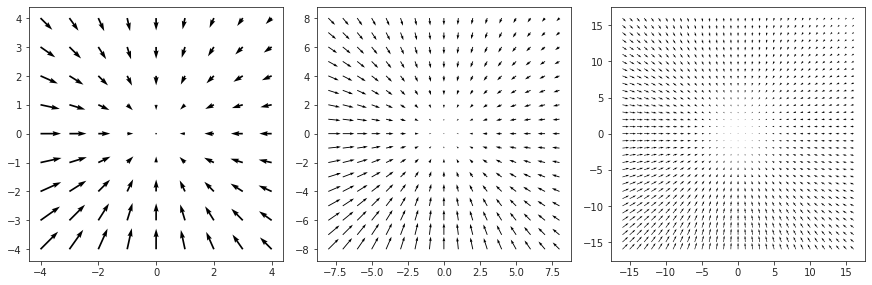

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [5. 5. 0.]

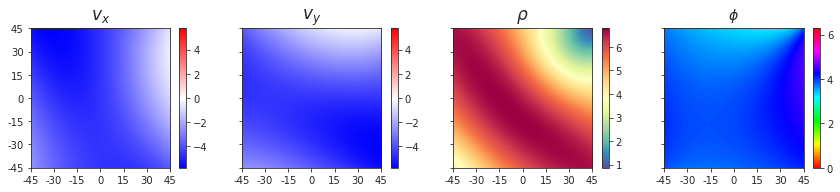

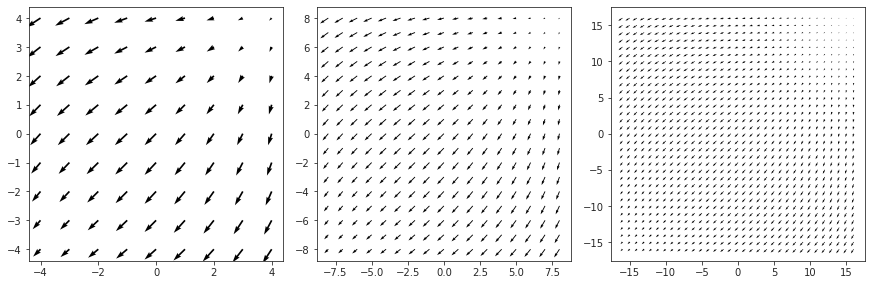

--------------------------------------------------------------------------------

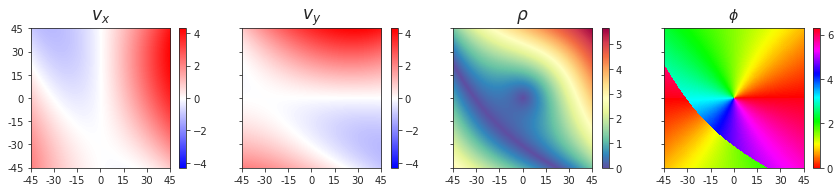

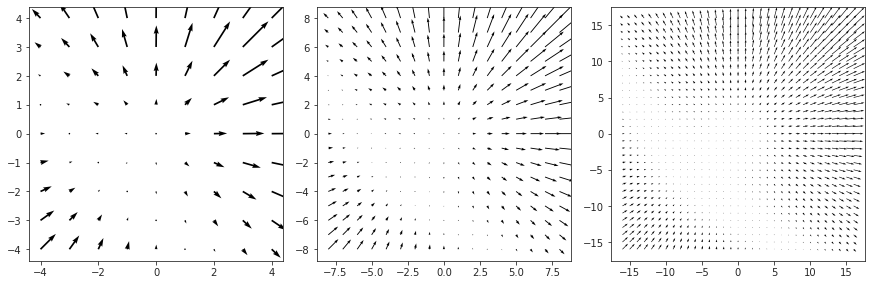

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [ 1. -2.  0.]

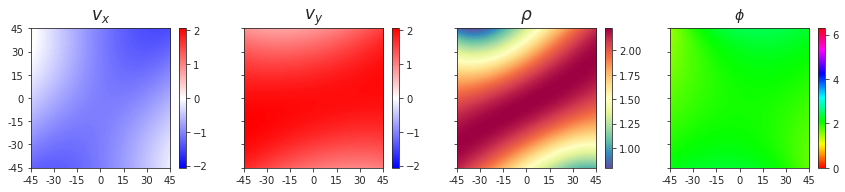

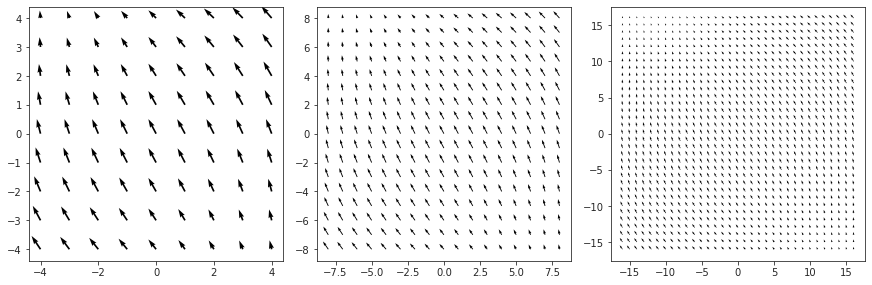

--------------------------------------------------------------------------------

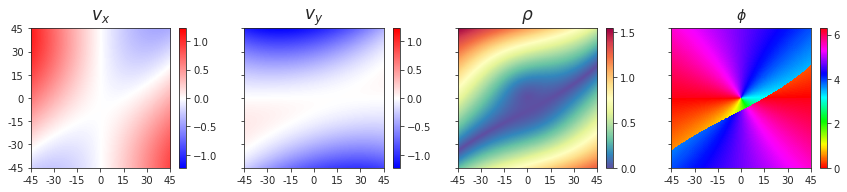

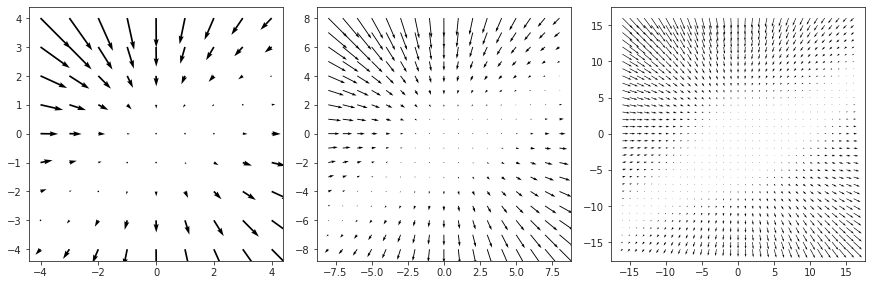

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [ 3.  0. 10.]

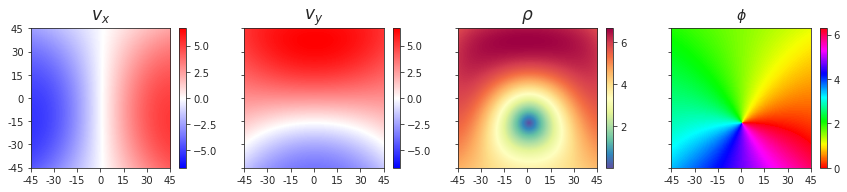

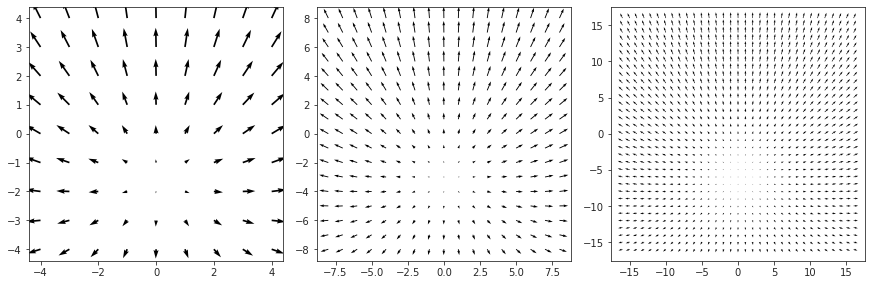

--------------------------------------------------------------------------------

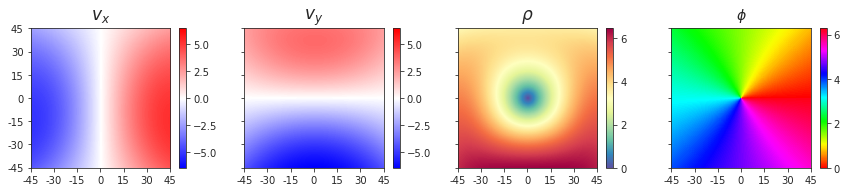

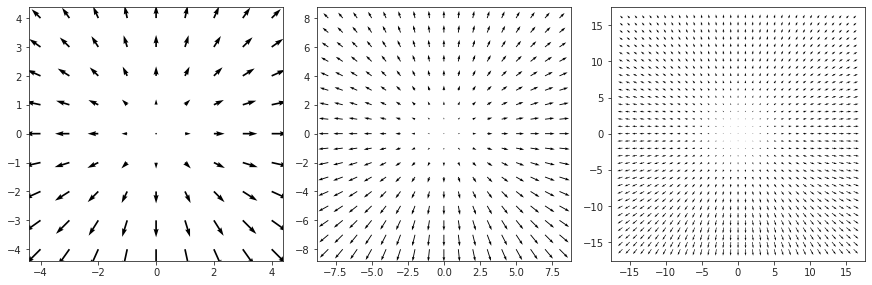

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [3. 3. 1.]

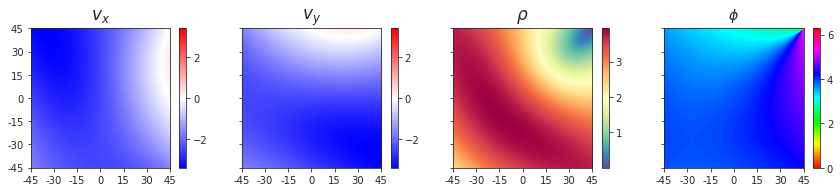

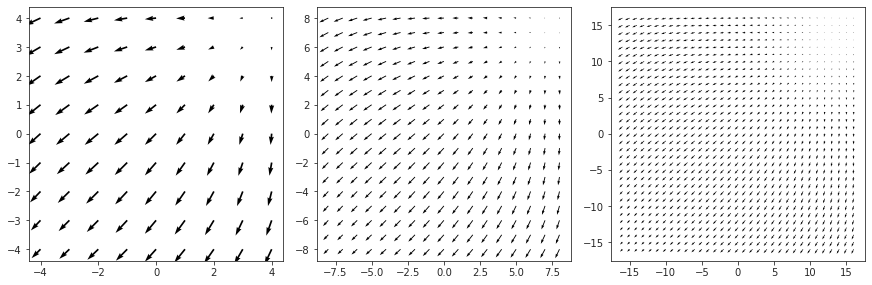

--------------------------------------------------------------------------------

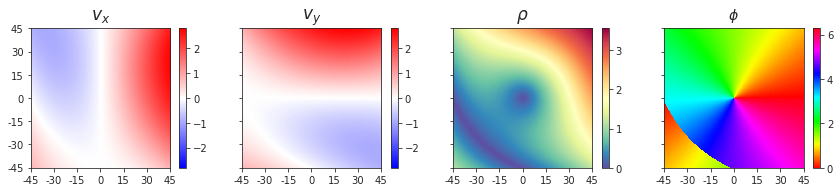

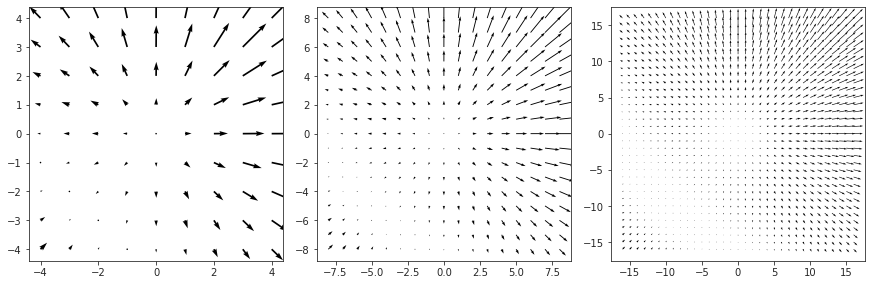

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

fixation: [0.3 0.3],    velocity: [-2.  1.  5.]

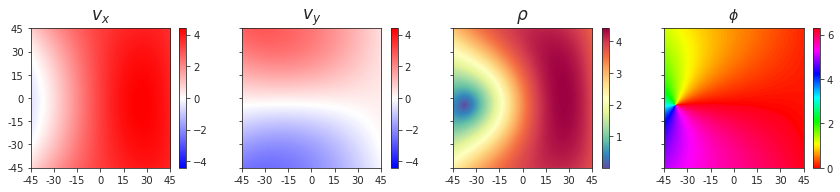

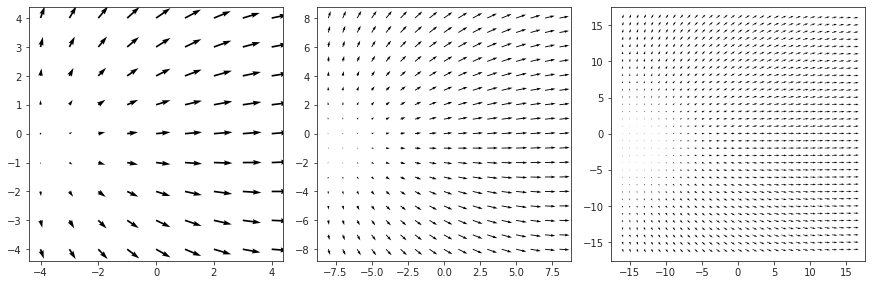

--------------------------------------------------------------------------------

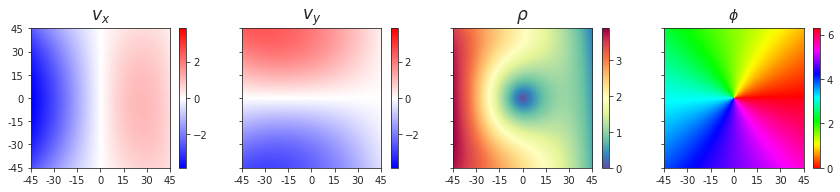

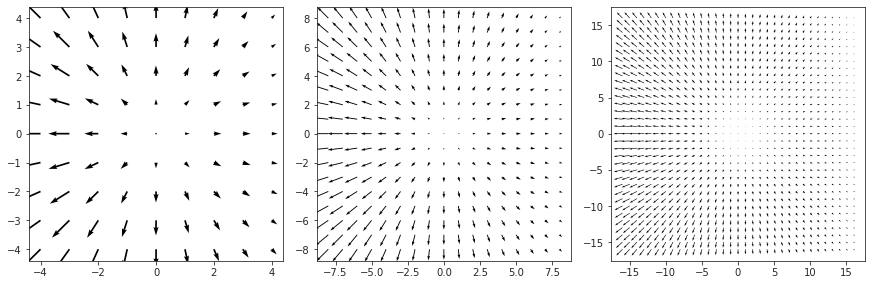

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------

In [22]:
for i in range(len(fix)):
    for j in range(vel.shape[1]):
        msg = f"fixation: {fix[i]},\tvelocity: {vel[:, j]}"
        print(msg)
        
        test = v_normal[i, ..., :2, j]
        show_velocity(test)
        show_opticflow(test)

        print('\n', '-' * 80, '\n')

        test = v_final[i, ..., :2, j]
        show_velocity(test)
        show_opticflow(test)
        
        print('\n', '-' * 80)
        print('-' * 80, '\n\n\n')

## Test limits (was old)

In [16]:
num = len(sim['span'])

In [17]:
aaa = polar2cart(np.concatenate([
    np.ones((num, num, 1)),
    np.expand_dims(sim['theta'], -1),
    np.expand_dims(sim['phi'], -1),
], axis=-1))
aaa.shape

(1801, 1801, 3)

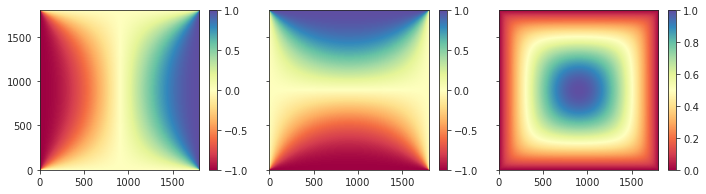

In [18]:
fig, axes = create_figure(1, 3, (10, 2.7), 'all', 'all', tight_layout=True)
im = axes[0].imshow(aaa[..., 0], cmap='Spectral')
plt.colorbar(im, ax=axes[0])

im = axes[1].imshow(aaa[..., 1], cmap='Spectral')
plt.colorbar(im, ax=axes[1])

im = axes[2].imshow(aaa[..., 2], cmap='Spectral')
plt.colorbar(im, ax=axes[2])

axes[-1].invert_yaxis()
plt.show()

In [19]:
fix = (0.4, 0, 1)
d0, theta0, phi0 = cart2polar(fix).ravel()
u0 = (-np.sin(phi0), np.cos(phi0), 0)
u0 = np.array(u0, dtype='float64')
r0 = rot.from_rotvec(theta0 * u0)

d0, theta0, phi0

(1.077032961426901, 0.38050637711236523, 0.0)

In [20]:
np.round(r0.apply(fix, inverse=True), 13)

array([-0.        ,  0.        ,  1.07703296])

In [21]:
bbb = r0.apply(flatten_arr(aaa))
bbb = bbb.reshape((num, num, -1))
ccc = cart2polar(bbb)

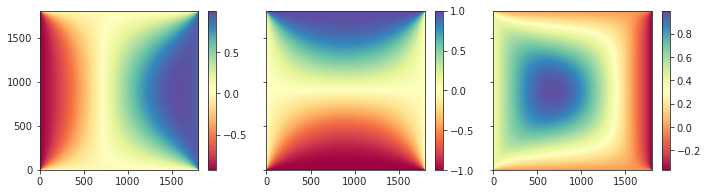

In [22]:
fig, axes = create_figure(1, 3, (10, 2.7), 'all', 'all', tight_layout=True)
im = axes[0].imshow(bbb[..., 0], cmap='Spectral')
plt.colorbar(im, ax=axes[0])

im = axes[1].imshow(bbb[..., 1], cmap='Spectral')
plt.colorbar(im, ax=axes[1])

im = axes[2].imshow(bbb[..., 2], cmap='Spectral')
plt.colorbar(im, ax=axes[2])

axes[-1].invert_yaxis()
plt.show()

In [23]:
collections.Counter(np.round(ccc[..., 0].ravel(), 14))

Counter({1.0: 3243601})

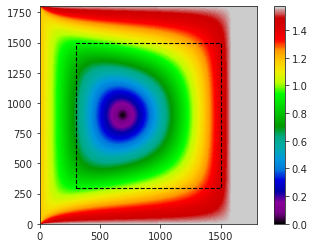

In [24]:
fig, ax = create_figure()
im = ax.imshow(ccc[..., 1], vmin=0, vmax=np.pi/2, cmap='nipy_spectral')
plt.colorbar(im, ax=ax)
ax.invert_yaxis()

rect = matplotlib.patches.Rectangle(
    xy=(np.where(sim['valid'])[0][0], np.where(sim['valid'])[0][0]),
    width=sim['valid'].sum(),
    height=sim['valid'].sum(),
    facecolor='none',
    edgecolor='k',
    ls='--',
    lw=1.1,
)
ax.add_patch(rect)
plt.show()

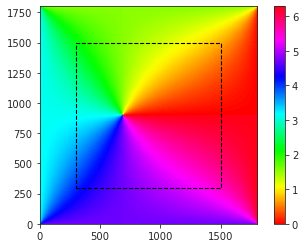

In [25]:
fig, ax = create_figure()
im = ax.imshow(ccc[..., 2], vmin=0, vmax=2*np.pi, cmap='hsv')
plt.colorbar(im, ax=ax)
ax.invert_yaxis()

rect = matplotlib.patches.Rectangle(
    xy=(np.where(sim['valid'])[0][0], np.where(sim['valid'])[0][0]),
    width=sim['valid'].sum(),
    height=sim['valid'].sum(),
    facecolor='none',
    edgecolor='k',
    ls='--',
    lw=1.1,
)
ax.add_patch(rect)
plt.show()

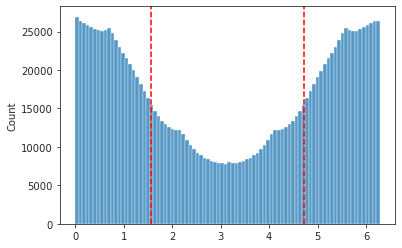

In [26]:
sns.histplot(ccc[..., 2][sim['valid']][:, sim['valid']].ravel())
plt.axvline(np.pi / 2, color='r', ls='--')
plt.axvline(2 * np.pi - np.pi / 2, color='r', ls='--');

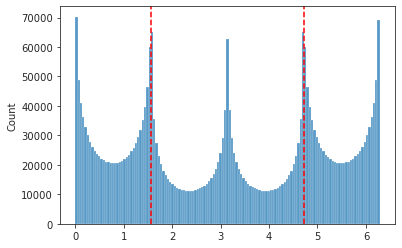

In [27]:
sns.histplot(ccc[..., 2].ravel())
plt.axvline(np.pi / 2, color='r', ls='--')
plt.axvline(2 * np.pi - np.pi / 2, color='r', ls='--');

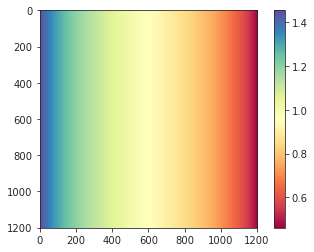

In [28]:
plt.imshow(sim['gamma'][..., 2][sim['valid']][:, sim['valid']], cmap='Spectral')
plt.colorbar()

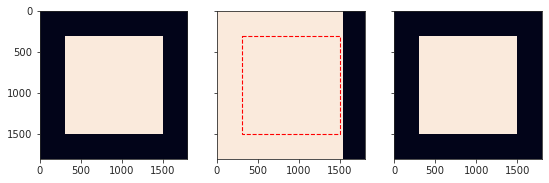

In [29]:
valid_1 = valid.reshape(-1, 1) @ valid.reshape(1, -1)

x0 = 0.5
y0 = 0

valid_2 = np.tan(sim['alpha']) @ np.array([x0, y0])
valid_2 = valid_2 < 1

fig, axes = create_figure(1, 3, (9, 3), 'all', 'all')
axes[0].imshow(valid_1)
axes[1].imshow(valid_2)
axes[2].imshow(np.logical_and(valid_1, valid_2))

rect = matplotlib.patches.Rectangle(
    xy=(np.where(valid)[0][0], np.where(valid)[0][0]),
    width=valid.sum(),
    height=valid.sum(),
    facecolor='none',
    edgecolor='red',
    ls='--',
    lw=1.1,
)
axes[1].add_patch(rect)

plt.show()

## Task (tomorrow Tuesday):

Do a linspan over x0 and y0 in range (0, 1) and plot the valid values for fixation points. The valid points are the ones that valid_2 (above) is strictly contains valid_1 (in other words, when we go the the valid_1 square, all points in there already exist in valid_2)

In [33]:
fov = 45

sim = simflow(
    fix=np.array([0.4, -0.3]).reshape(1, -1),
    dtype='float64',
    fov=fov,
)

In [34]:
valid = sim['valid'].copy()

ticks, ticklabels = zip(*[
    (i, str(int(np.round(np.rad2deg(x)))))
    for i, x in enumerate(sim['span'][valid]) if i % 150 == 0
])
ticklabels

('-45', '-30', '-15', '0', '15', '30', '45')

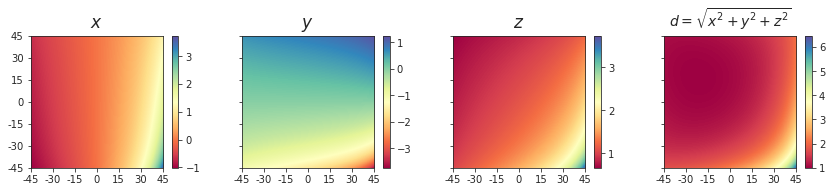

In [35]:
show_xyzd(
    x=sim['x'][valid][:, valid],
    y=sim['y'][valid][:, valid],
    z=sim['z'][valid][:, valid],
    d=sim['d'][valid][:, valid],
)

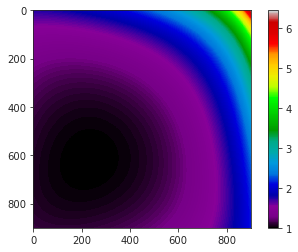

In [36]:
plt.imshow(sim['d'][valid][:, valid], cmap='nipy_spectral')
plt.colorbar();

## Test the inequality for valid x0 and y0

In [40]:
res = 0.1
extent = 90
fov = 60

num = int(np.round(2 * extent / res)) + 1
span = np.deg2rad(np.linspace(-extent, extent, num))
valid = np.abs(span) <= np.deg2rad(fov)
valid_1 = valid.reshape(-1, 1) @ valid.reshape(1, -1)

a, b = np.meshgrid(span, span)
alpha = np.concatenate([
    np.expand_dims(a, -1),
    np.expand_dims(b, -1),
], axis=-1)
tan = np.tan(alpha)

In [41]:
def get_valid2(x0, y0):
    valid_2 = tan @ np.array([x0, y0])
    valid_2 = valid_2 < 1
    return overlap_score(valid_1, valid_2)

In [42]:
%%time

nn = 201

with joblib.parallel_backend('multiprocessing'):
    scores = joblib.Parallel(n_jobs=-1)(
        joblib.delayed(get_valid2)(x0, y0)
        for x0, y0 in itertools.product(
            np.linspace(-1, 1, nn),
            np.linspace(-1, 1, nn),
        )
    )
scores = np.reshape(scores, (nn, nn))

CPU times: user 2min 18s, sys: 41.1 s, total: 2min 59s
Wall time: 4min 55s


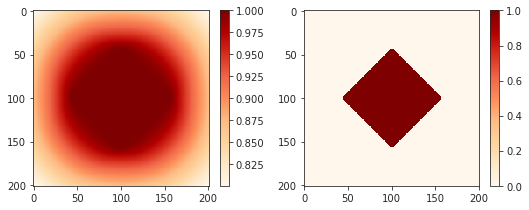

In [43]:
fig, axes = create_figure(1, 2, (7.5, 3), tight_layout=True)
im = axes[0].imshow(scores, cmap='OrRd')
plt.colorbar(im, ax=axes[0])

im = axes[1].imshow(scores == 1, cmap='OrRd')
plt.colorbar(im, ax=axes[1])

In [44]:
np.linspace(-1, 1, nn)[scores[100] == 1]

array([-0.57, -0.56, -0.55, -0.54, -0.53, -0.52, -0.51, -0.5 , -0.49,
       -0.48, -0.47, -0.46, -0.45, -0.44, -0.43, -0.42, -0.41, -0.4 ,
       -0.39, -0.38, -0.37, -0.36, -0.35, -0.34, -0.33, -0.32, -0.31,
       -0.3 , -0.29, -0.28, -0.27, -0.26, -0.25, -0.24, -0.23, -0.22,
       -0.21, -0.2 , -0.19, -0.18, -0.17, -0.16, -0.15, -0.14, -0.13,
       -0.12, -0.11, -0.1 , -0.09, -0.08, -0.07, -0.06, -0.05, -0.04,
       -0.03, -0.02, -0.01,  0.  ,  0.01,  0.02,  0.03,  0.04,  0.05,
        0.06,  0.07,  0.08,  0.09,  0.1 ,  0.11,  0.12,  0.13,  0.14,
        0.15,  0.16,  0.17,  0.18,  0.19,  0.2 ,  0.21,  0.22,  0.23,
        0.24,  0.25,  0.26,  0.27,  0.28,  0.29,  0.3 ,  0.31,  0.32,
        0.33,  0.34,  0.35,  0.36,  0.37,  0.38,  0.39,  0.4 ,  0.41,
        0.42,  0.43,  0.44,  0.45,  0.46,  0.47,  0.48,  0.49,  0.5 ,
        0.51,  0.52,  0.53,  0.54,  0.55,  0.56,  0.57])

In [48]:
1 / np.tan(np.deg2rad(60))

0.577350269189626

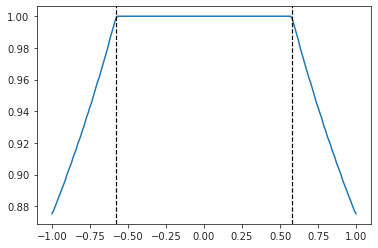

In [51]:
plt.plot(np.linspace(-1, 1, nn), scores[100])
plt.axvline(1 / np.tan(np.deg2rad(60)), color='k', ls='--', lw=1.2)
plt.axvline(- 1 / np.tan(np.deg2rad(60)), color='k', ls='--', lw=1.2);

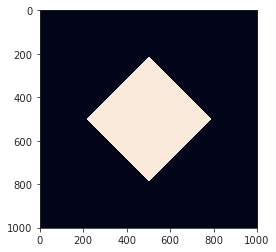

In [52]:
nn = 1001
another = np.zeros((nn, nn))
for (i, x0), (j, y0) in itertools.product(
    enumerate(np.linspace(-1, 1, nn)),
    enumerate(np.linspace(-1, 1, nn))):
    if abs(x0) + abs(y0) < 1 / np.tan(np.deg2rad(fov)):
        another[j, i] = 1
        
plt.imshow(another);